# Rolling Horizon Framework - Notebook 2
This notebook contains code for the initial analysis seen for the parameter analysis of the RH framework WITHOUT UNCERTAINTY

In [1]:


import gurobipy as gp  

# Create an environment with your WLS license
params = {
"WLSACCESSID": '3c7664d9-a91c-4ed0-9b3b-b081e39c7003',
"WLSSECRET": '9689803a-3d35-439b-8270-34d60b732a6b',
"LICENSEID": 2440162,
}


In [2]:
env = gp.Env(params=params)

# Create the model within the Gurobi environment
model = gp.Model(env=env)

Set parameter WLSAccessID
Set parameter WLSSecret
Set parameter LicenseID to value 2440162
Academic license 2440162 - for non-commercial use only - registered to sa___@ucl.ac.uk


In [3]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from scipy.stats import linregress

import pickle

import matplotlib as mpl
import matplotlib.font_manager as font_manager

mpl.rcParams['font.family']='serif'
cmfont = font_manager.FontProperties(fname=mpl.get_data_path() + '/fonts/ttf/cmr10.ttf')
mpl.rcParams['font.serif']=cmfont.get_name()
mpl.rcParams['mathtext.fontset']='cm'
mpl.rcParams['axes.unicode_minus']=False


## Household demand

Household demand is used by one dataset that collects detailed 

                    UTC                   DE TIME    kWh  0.045  \
0  2015-10-26T11:00:00Z  2015-10-26T12:00:00+0100  0.045  0.395   
1  2015-10-26T12:00:00Z  2015-10-26T13:00:00+0100  0.395  0.865   
2  2015-10-26T13:00:00Z  2015-10-26T14:00:00+0100  0.865  1.085   
3  2015-10-26T14:00:00Z  2015-10-26T15:00:00+0100  1.085  1.325   
4  2015-10-26T15:00:00Z  2015-10-26T16:00:00+0100  1.325  1.435   

   Power Change (kWh)  
0                0.00  
1                0.35  
2                0.47  
3                0.22  
4                0.24  
Starting date: 2015-10-26 11:00:00+00:00
Ending date: 2019-05-01 22:00:00+00:00
[270.10362873 221.481331   182.62306652 ... 142.99830153  68.79728194
 134.03565444]


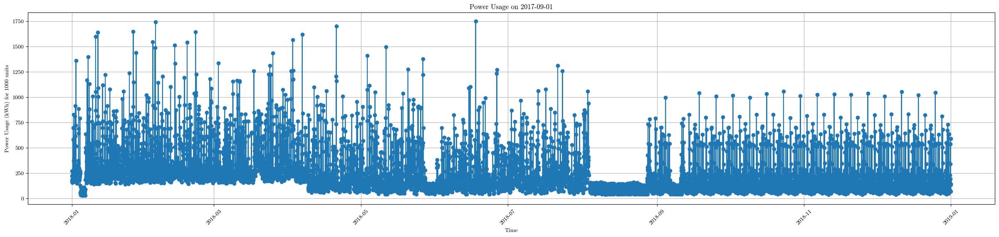

In [4]:

# Load and preprocess household demand data
df = pd.read_csv("demand.csv")
df['Power Change (kWh)'] = df['kWh'].diff().fillna(0)
df = df.loc[:, ~df.columns.str.contains('^Unnamed')]
print(df.head())

# Convert UTC timestamp to datetime and select a random date for plotting
df['UTC'] = pd.to_datetime(df['UTC'])
df['Date'] = df['UTC'].dt.date
random_date = np.random.choice(df['Date'].unique())
day_data = df[df['Date'] == random_date]


# Assuming 'UTC time' is the column with your dates
start_date = df['UTC'].min()
end_date = df['UTC'].max()

print(f"Starting date: {start_date}")
print(f"Ending date: {end_date}")


# Filter the DataFrame for the specified date range
filtered_df = df[(df['UTC'] >= '2018-01-01') & (df['UTC'] <= '2019-01-01')]


def adjust_kwh(units):
    # Multiply the 'kWh' column by the number of units
    adjusted_values = filtered_df['Power Change (kWh)'] * units
    
    # Add a 3% random error to each value
    # The random error is generated as 3% of the adjusted value multiplied by a random number between -1 and 1
    random_error = adjusted_values * 0.03 * np.random.uniform(-1, 1, size=adjusted_values.shape)
    
    # Apply the random error to the adjusted values
    final_values = adjusted_values + random_error
    
    # Return the final values as a NumPy array
    return final_values.to_numpy()

result_array = adjust_kwh(1000)

# Display the result
print(result_array)



# Plotting
plt.figure(figsize=(30, 6))
plt.plot(filtered_df['UTC'], result_array, marker='o', linestyle='-')
plt.title(f'Power Usage on {random_date}')
plt.xlabel('Time')
plt.ylabel('Power Usage (kWh) for 1000 units')
plt.xticks(rotation=45)
plt.grid(True)
plt.show()

## Prices

In [5]:
# Load the CSV file
file_path = "15minprices.csv"
df_prices = pd.read_csv(file_path)
# Set the font family to Times New Roman


df_prices['Day-ahead Price [EUR/MWh]'].fillna(method='ffill', inplace=True)
df_prices['MTU (CET/CEST)'].str.split('-').str[0].str.strip()
df_prices['Timestamp'] = pd.to_datetime(df_prices['MTU (CET/CEST)'].str.split('-').str[0].str.strip(), format="%d.%m.%Y %H:%M")

# Set the datetime as the index
df_prices.set_index('Timestamp', inplace=True)

# Resample to hourly intervals and calculate the mean
df_prices = df_prices['Day-ahead Price [EUR/MWh]'].resample('H').mean().reset_index()

# Resulting DataFrame has hourly intervals with the average price
print(df_prices.shape)

df_prices.head()




(8760, 2)


,Timestamp,Day-ahead Price [EUR/MWh]
0,2019-01-01 00:00:00,20.0025
1,2019-01-01 01:00:00,13.5400
2,2019-01-01 02:00:00,5.5925
3,2019-01-01 03:00:00,3.2000
4,2019-01-01 04:00:00,3.8975


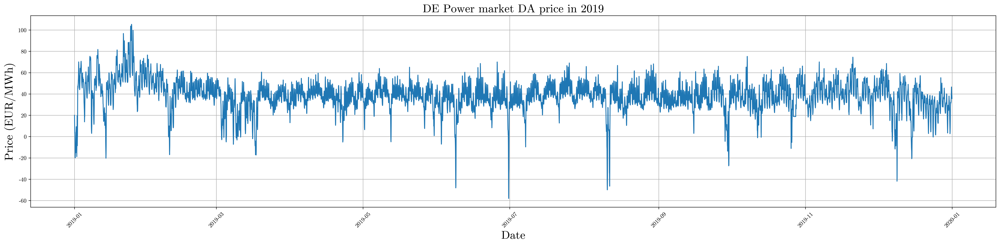

In [6]:

# Plotting
plt.figure(figsize=(30, 6),dpi=300)
plt.plot(df_prices['Timestamp'] ,df_prices['Day-ahead Price [EUR/MWh]'], marker='', linestyle='-')
plt.title(f'DE Power market DA price in 2019',fontsize=20)
plt.xlabel('Date', fontsize=20)
plt.ylabel('Price (EUR/MWh)', fontsize=20)
plt.xticks(rotation=45)
plt.grid(True)
plt.savefig("pricechart.png")
plt.show()

## Solar

In [7]:
df_solar = pd.read_csv("solar.csv")
df_solar.head()

,time,local_time,electricity
0,1/1/2019 0:00,1/1/2019 1:00,0.0
1,1/1/2019 1:00,1/1/2019 2:00,0.0
2,1/1/2019 2:00,1/1/2019 3:00,0.0
3,1/1/2019 3:00,1/1/2019 4:00,0.0
4,1/1/2019 4:00,1/1/2019 5:00,0.0


# Final parameters

In [8]:
df_prices

,Timestamp,Day-ahead Price [EUR/MWh]
0,2019-01-01 00:00:00,20.0025
1,2019-01-01 01:00:00,13.5400
2,2019-01-01 02:00:00,5.5925
3,2019-01-01 03:00:00,3.2000
4,2019-01-01 04:00:00,3.8975
...,...,...
8755,2019-12-31 19:00:00,43.1625
8756,2019-12-31 20:00:00,40.5000
8757,2019-12-31 21:00:00,38.5000
8758,2019-12-31 22:00:00,38.5975


In [9]:
df_demand = filtered_df
df_demand.head()

,UTC,DE TIME,kWh,0.045,Power Change (kWh),Date
19141,2018-01-01 00:00:00+00:00,2018-01-01T01:00:00+0100,5975.186,5975.412,0.265,2018-01-01
19142,2018-01-01 01:00:00+00:00,2018-01-01T02:00:00+0100,5975.412,5975.591,0.226,2018-01-01
19143,2018-01-01 02:00:00+00:00,2018-01-01T03:00:00+0100,5975.591,5975.752,0.179,2018-01-01
19144,2018-01-01 03:00:00+00:00,2018-01-01T04:00:00+0100,5975.752,5975.981,0.161,2018-01-01
19145,2018-01-01 04:00:00+00:00,2018-01-01T05:00:00+0100,5975.981,5976.211,0.229,2018-01-01


In [10]:
N = 456
np.sum(np.array(df_demand["Power Change (kWh)"][N:N+24]))

7.578000000000429

In [11]:
df_solar.head()

,time,local_time,electricity
0,1/1/2019 0:00,1/1/2019 1:00,0.0
1,1/1/2019 1:00,1/1/2019 2:00,0.0
2,1/1/2019 2:00,1/1/2019 3:00,0.0
3,1/1/2019 3:00,1/1/2019 4:00,0.0
4,1/1/2019 4:00,1/1/2019 5:00,0.0


In [12]:
len(df_demand)

8761

# Running the RH Algorithm

In [13]:
from gurobipy import Model, GRB, quicksum
import pandas as pd
import numpy as np
import scipy as sp
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D
from scipy.interpolate import griddata


## Deterministic optimisation function

In [14]:
def det_optimisation(inter_mg_limit, spread, charge_limit, trade_cost, demand_subset, PVgen_subset, price_subset,
                        num_periods, currentSOC,max_capacity, outputflag):
    
    demand = demand_subset
    PVgen = PVgen_subset
    main_grid_prices = price_subset

    # Create a new model
    model = Model("EnergyModel")

    model.setParam('OutputFlag', outputflag)

    
    #Energy purchased from the main grid for each MG in each time period
    Emb = model.addVars(num_consumers, num_periods, name="EM_{i,b}^t", lb=0, vtype=GRB.CONTINUOUS)
    
    #Energy sold to the main grid for each MG in each time period
    Ems = model.addVars(num_consumers, num_periods, name="EM_{i,s}^t", lb=0, vtype=GRB.CONTINUOUS)
    
    #BESS energy stored for each MG iat the end of each time period
    SOC = model.addVars(num_consumers, num_periods, name="EB_{i} ^t", vtype=GRB.CONTINUOUS)


    #Binary variable deciding if BESS is charged for each MG in each time period
    Yc = model.addVars(num_consumers, num_periods, name="Y_{i,C} ^t", vtype=GRB.BINARY)

    #Binary variable deciding if BESS is discharged for each MG in each time period
    Yd = model.addVars(num_consumers, num_periods, name="Y_{i,D} ^t", vtype=GRB.BINARY)
    
    
    #Energy retrieved from battery for each MG in each time period
    Ebc = model.addVars(num_consumers, num_periods, name="EB_{i,C} ^t", lb=0, vtype=GRB.CONTINUOUS)
    Ebd = model.addVars(num_consumers, num_periods, name="EB_{i,D} ^t", lb=0, vtype=GRB.CONTINUOUS)
    

    #Energy retrieved from battery for each MG in each time period
    Emg = model.addVars(num_consumers, num_consumers, num_periods, name="Emg",lb=-2.75e8, vtype=GRB.CONTINUOUS)
    EMGi = model.addVars(num_consumers,num_periods, lb=-2.75e8, name="EMGi", vtype=GRB.CONTINUOUS)
    
    #Cost of MG at time t 
    C = model.addVars(num_consumers, num_periods, name="C", lb=-1e12, vtype=GRB.CONTINUOUS)

    #CONSTRAINTS


    #Basic demand constraint
    for i in range(num_consumers):
        for t in range(num_periods):
            model.addConstr( 0 <= - demand[i, t]+  Emb[i, t] - Ems[i,t] + PVgen[i, t] + Ebd[i, t] - Ebc[i,t]  + EMGi[i,t])
    for i in range(num_consumers):
        #ENd SOC must be initial SOC
        model.addConstr(SOC[i, num_periods-1] >= currentSOC[i] )   
        for t in range(1, num_periods):
        #SOC updating
            model.addConstr(SOC[i, t] == SOC[i, t-1] + (eta*Ebc[i,t] - (1/eta)*Ebd[i,t]))

    for i in range(num_consumers):
        #Charge/Discharge equation for first time step
        model.addConstr(SOC[i, 0] == currentSOC[i] + (eta*Ebc[i,0] - (1/eta)*Ebd[i,0]), name=f"BS1_{i}")
        for t in range(num_periods):
            #Charge/discharge limit
        
            model.addConstr(charge_limit*max_capacity[i]*Yc[i,t] >=  Ebc[i, t])
            model.addConstr(charge_limit*max_capacity[i]*Yd[i,t] >=  Ebd[i, t])
            model.addConstr(Yc[i,t] + Yd[i,t] == 1)
            #Minimum SOC level is 10% of initial
            model.addConstr(SOC[i, t] >= 0.1*max_capacity[i] )
            model.addConstr(SOC[i, t] <= 1.0*max_capacity[i] )

    # Energy trading between MG
    for i in range(num_consumers):
        for j in range(num_consumers):
            for t in range(0, num_periods):
                #energy traded from i to j is net energy, so is negative of j to i
                model.addConstr(Emg[i,j,t] == -Emg[j,i,t])
                #energy traded from i to i is 0
                model.addConstr(Emg[i,i,t] == 0)
                #energy traded from i to j is constrained by max value
                model.addConstr(Emg[i,j,t] <= inter_mg_limit, name=f"inter_{i}_{j}_{t}")
                model.addConstr(Emg[i,j,t] >= -inter_mg_limit)

    for i in range(num_consumers):
        for t in range(num_periods):
             model.addConstr(EMGi[i,t] == quicksum(Emg[i,j,t] for j in range(num_consumers) ))

    for i in range(num_consumers):
        for t in range(num_periods):
            #Sale volume limit
             model.addConstr(Ems[i,t] <= demand[i,t]*1)

    for i in range(num_consumers):
        for t in range(num_periods):
            #Purchase volume limit
             model.addConstr(Emb[i,t] <= demand[i,t]*2)

    if trade_cost is True:
        #Cost of operation of MG:
        for i in range(num_consumers):
            for t in range(num_periods):
                    model.addConstr(C[i,t] == Emb[i, t] * (1.00 + spread) *main_grid_prices[t] - Ems[i, t] * (1-spread) *main_grid_prices[t] + 
                                     EMGi[i,t] * main_grid_prices[t] , name=f"bruh{i}{t}")
    else:
         #Cost of operation of MG:
        for i in range(num_consumers):
            for t in range(num_periods):
                    model.addConstr(C[i,t] == Emb[i, t] * (1.00 + spread) *main_grid_prices[t] - Ems[i, t] * (1-spread) *main_grid_prices[t]  , name=f"bruh{i}{t}")

    #Same weighting for all MGs, global minimum cost required
    a = np.array([1,1,1,1])
    obj = quicksum(a[i]*C[i,t] for i in range(num_consumers) for t in range(num_periods)) 
    
    # Set the objective
    model.setObjective(obj, GRB.MINIMIZE)

    # Solve the model
    model.optimize()
    
    con = model.getConstrByName('inter_1_0_0')


    
    
    total_sold = sum(Ems[i,t].X for i in range(num_consumers) for t in range(num_periods))
    # print(total_sold)
    
    total_battery = Emg[0,1,0].X
    total_cost = sum(C[i,t].X for i in range(num_consumers) for t in range(num_periods))
    current_cost = sum(C[i,0].X for i in range(num_consumers))
    current_SOC = [[SOC[i,j].X for i in range(num_consumers)] for j in range(num_periods)]
    cost_list = [[C[i,j].X for i in range(num_consumers)] for j in range(num_periods)]
    #print(total_sold)
    return total_sold, total_cost, total_battery, current_cost, current_SOC, cost_list, model


## Converting dataframes into parameter sets

### Deciding on the number of consumers and number of periods/hours (length of parameter set)

In [15]:
num_consumers = 3
num_periods = 8760

### Deciding on the number of houses/units in each MG

In [16]:
# Number of houses/units in each of the three microgrids
number_of_homes = np.array([200, 600, 1900])


### Creating demand parameter set

In [17]:
# Convert sets to float to avoid type casting issues
demand_set = np.array(df_demand["Power Change (kWh)"].astype(float))
demand_values = demand_set/1000
demand_list = demand_values * number_of_homes[:, np.newaxis]
demand_list.shape


(3, 8761)

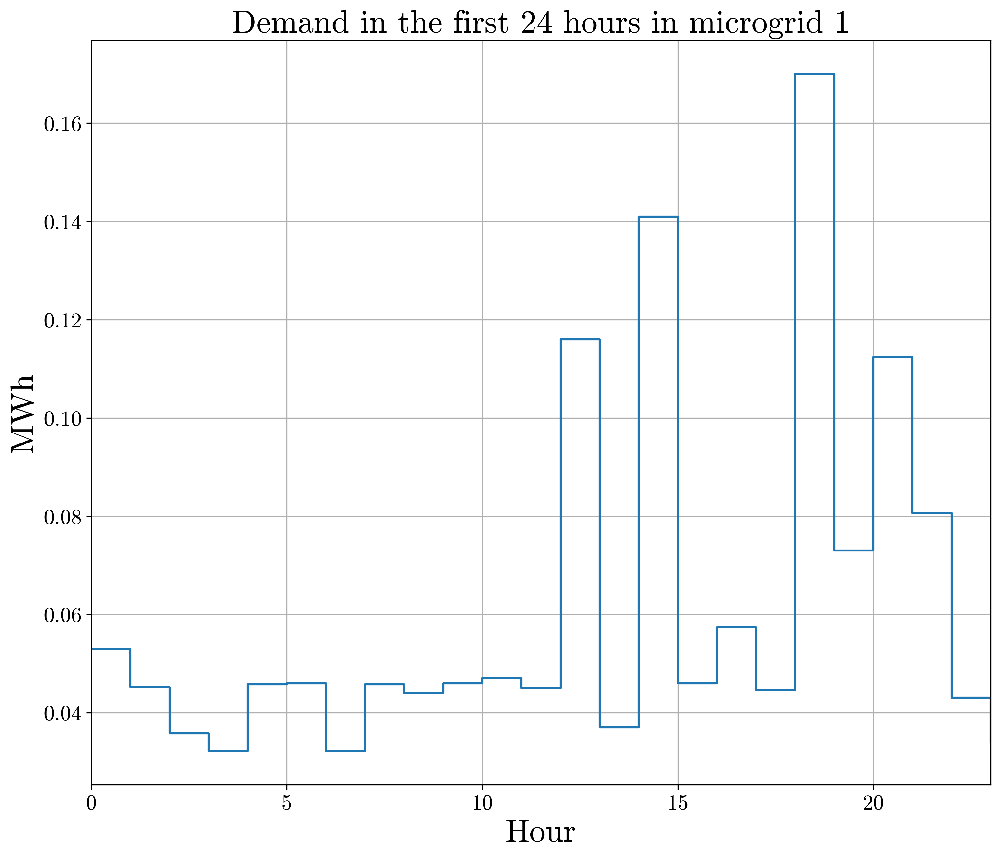

In [18]:
# Plotting the array
plt.figure(figsize=(12,10), dpi=300)
plt.plot(demand_list[0,:24], marker=' ', drawstyle="steps-post")  # 'o' creates a circle marker at each data point
plt.title('Demand in the first 24 hours in microgrid 1', fontsize=24)
plt.tick_params(axis='both', which='major', labelsize=16)
plt.tick_params(axis='both', which='minor', labelsize=16)
plt.xlabel('Hour' , fontsize=24)
plt.xlim([0,23])
plt.ylabel('MWh' , fontsize=24)
plt.grid(True)  # Adds a grid for easier visualization
plt.savefig("demand_example.png")
plt.show()

### Creating PV production parameter set

In [19]:
# Average solar panel capacity per house in each microgrid in kW
PVavg = {1: 1.2, 2: 0.9, 3: 1.5}
solar_irradiance_values = np.array(df_solar.electricity.astype(float))

# Initialize the PV generation array
PV_list = np.zeros((num_consumers, num_periods))

# Calculate PV generation for each consumer and time period
for i in range(num_consumers):
    for t in range(num_periods):
        PV_list[i, t] = solar_irradiance_values[t] * PVavg[i+1] * number_of_homes[i]/1000  # i+1 because dictionary keys start at 1
        
# PVgen is now populated with the PV generation values in MWh for each consumer and time period
PV_list[1,]

len(PV_list[1,])

8760

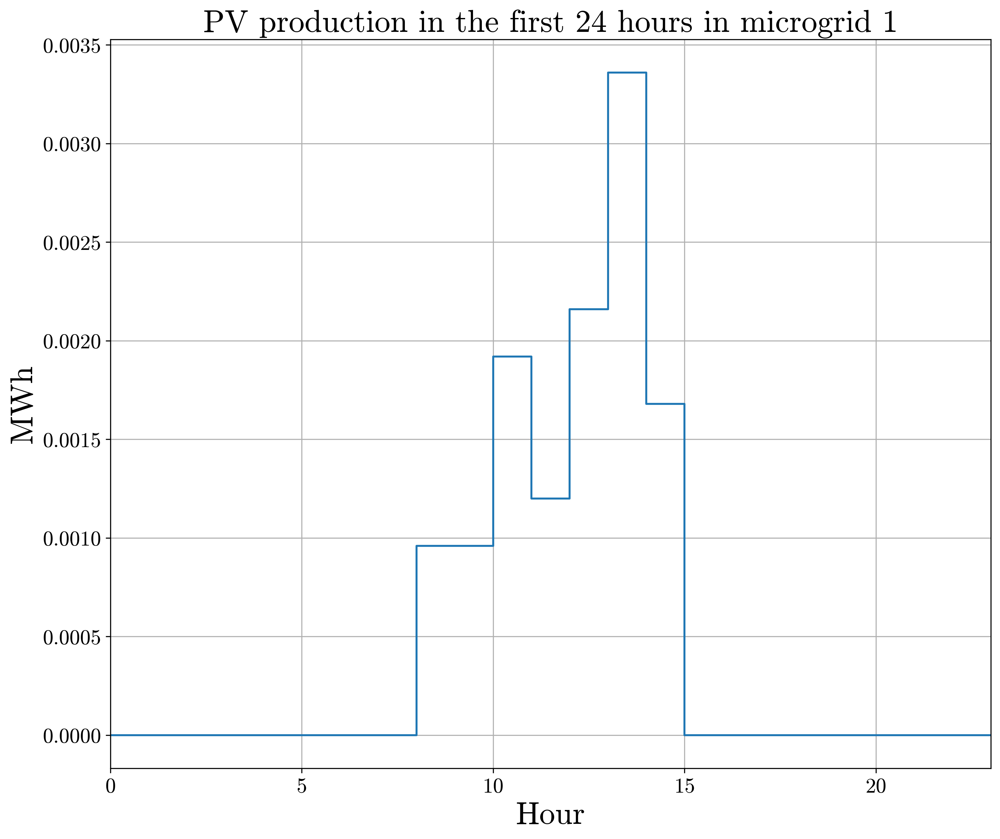

In [20]:
# Plotting the array
plt.figure(figsize=(12,10), dpi=300)
plt.plot(PV_list[0,:24], marker=' ', drawstyle="steps-post")  # 'o' creates a circle marker at each data point
plt.title('PV production in the first 24 hours in microgrid 1', fontsize=24)
plt.tick_params(axis='both', which='major', labelsize=16)
plt.tick_params(axis='both', which='minor', labelsize=16)
plt.xlabel('Hour' , fontsize=24)
plt.xlim([0,23])
plt.savefig("PV_example.png")
plt.ylabel('MWh' , fontsize=24)
plt.grid(True)  # Adds a grid for easier visualization
plt.show()

### Setting PV capacities of each MG

# Experiment Set 1: Exploratory analysis of RH algorithm
## Test 1: 12 hour horizon for 2 months

In [21]:
import time
start_time = time.time()

# Constants
NUM_CONSUMERS = 3
SIMULATION_DURATION = 24*3
HORIZON_LENGTH = 12  # Planning horizon length in hours
INTER_MICROGRID_LIMIT = 0.1  # Inter-microgrid trading limit
PRICE_SPREAD = 0.05  # Price spread for trades
CHARGING_LIMIT = 0.1 # Battery charging limit
TRADE_COST_ENABLED = True  # Flag for enabling trade costs
UNCERTAINTY_SIGMA = 0.0  # Price/Demand/PV uncertainty
CHARGING_EFFICIENCY = 0.95  # Charging efficiency
eta=CHARGING_EFFICIENCY
SEED = 42  # Seed for random number generator

# Initialize random seed
np.random.seed(SEED)

# Data initialization
price_set = np.array(df_prices["Day-ahead Price [EUR/MWh]"].astype(float))
# Uncomment the next line if you want to replace negative prices with 5 EUR/MWh
# price_set = np.where(price_set < 0, 5, price_set)

# Initialize State of Charge (SOC)
max_capacity = np.array([PVavg[i + 1] * number_of_homes[i] * 1e-3 * 1.5 for i in range(NUM_CONSUMERS)])
current_SOC = max_capacity*0.1

print("Initial SOC:", current_SOC)
print("Max capacity:", max_capacity)

# Initialize simulation variables
total_rolling_horizon_cost = 0
rolling_horizon_costs = []

# Convert arrays to float to avoid typecasting issues later
demand_set = demand_list.astype(float)
PV_generation_set = PV_list.astype(float)

# Simulation loop
for hour in range(SIMULATION_DURATION):
    horizon_end = min(hour + HORIZON_LENGTH, SIMULATION_DURATION)

    demand_subset = demand_set[:, hour:horizon_end]
    PV_generation_subset = PV_generation_set[:, hour:horizon_end]
    price_subset = price_set[hour:horizon_end]

    try:
        total_sold, total_cost, total_battery_usage, current_cost, updated_SOC, cost_list, model = det_optimisation(
            INTER_MICROGRID_LIMIT, PRICE_SPREAD, CHARGING_LIMIT, TRADE_COST_ENABLED,
            demand_subset, PV_generation_subset, price_subset, horizon_end - hour, current_SOC, max_capacity, outputflag=0
        )
        current_SOC = updated_SOC[0]  # Update SOC for the next iteration
    except Exception as e:
        print(f"Optimization failed at hour {hour}: {e}")
        continue
    
    # Update costs and SOC for the next iteration
    rolling_horizon_costs.append(current_cost)
    total_rolling_horizon_cost += current_cost


# Data initialization
price_set = np.array(df_prices["Day-ahead Price [EUR/MWh]"].astype(float))
# Convert arrays to float to avoid typecasting issues later
demand_set = demand_list.astype(float)
PV_generation_set = PV_list.astype(float)

# Initialize State of Charge (SOC)
max_capacity = np.array([PVavg[i + 1] * number_of_homes[i] * 1e-3 * 1.5 for i in range(NUM_CONSUMERS)])
current_SOC = max_capacity*0.1



# Final aggregation and analysis
final_demand_subset = demand_set[:, :SIMULATION_DURATION]
final_PV_generation_subset = PV_generation_set[:, :SIMULATION_DURATION]
final_price_subset = price_set[:SIMULATION_DURATION]

total_sold, total_cost, total_battery_usage, final_cost, final_SOC, cost_list, model = det_optimisation(
    INTER_MICROGRID_LIMIT, PRICE_SPREAD, CHARGING_LIMIT, TRADE_COST_ENABLED,
    final_demand_subset, final_PV_generation_subset, final_price_subset, SIMULATION_DURATION, current_SOC, max_capacity, outputflag=0
)

print(f"Total rolling horizon cost: {total_rolling_horizon_cost}")
print(f"Deterministic cost: {total_cost}")


# Calculate and print the cost comparison
print(f"Printing determinstic/RH cost ratio: {abs(total_cost-total_rolling_horizon_cost)/total_cost}")
print(F"Price difference between determinsitic and RH cost: {total_rolling_horizon_cost - total_cost}")


total_deterministic_costs = [sum(sublist) for sublist in cost_list]



# Your code here
elapsed_time = time.time() - start_time
print(f"Elapsed time: {elapsed_time} seconds")



Initial SOC: [0.036  0.081  0.4275]
Max capacity: [0.36  0.81  4.275]
Set parameter WLSAccessID
Set parameter WLSSecret
Set parameter LicenseID to value 2440162
Academic license 2440162 - for non-commercial use only - registered to sa___@ucl.ac.uk
Total rolling horizon cost: 985.3230564051024
Deterministic cost: 838.3552335190745
Printing determinstic/RH cost ratio: 0.17530495070582036
Price difference between determinsitic and RH cost: 146.96782288602788
Elapsed time: 5.223358392715454 seconds


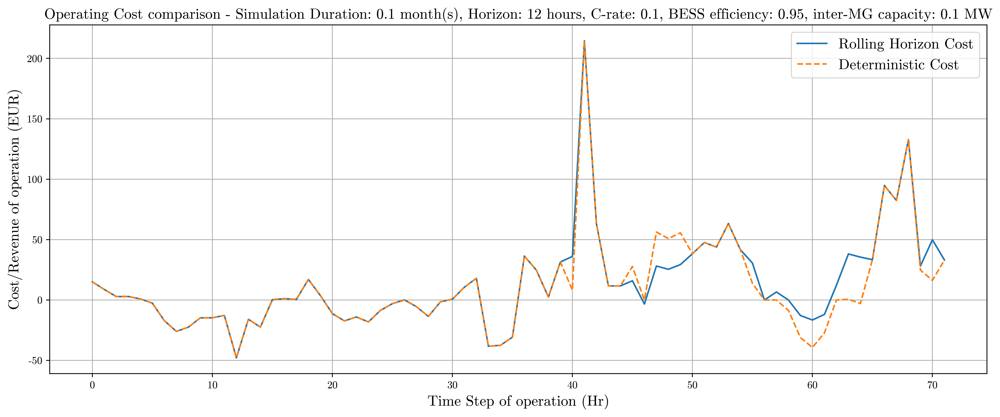

In [22]:

# Setting figure size
plt.figure(figsize=(16, 6), dpi=400)  # Adjust the values (width, height) as needed


# Plotting
plt.plot(rolling_horizon_costs, label='Rolling Horizon Cost', marker='None', linestyle='-')
plt.plot(total_deterministic_costs, label='Deterministic Cost', marker='None', linestyle='--')

plt.xlabel('Time Step of operation (Hr)', fontsize=14)
plt.ylabel('Cost/Revenue of operation (EUR)', fontsize=14)
plt.title(f'Operating Cost comparison - Simulation Duration: {SIMULATION_DURATION/(24*30)} month(s), Horizon: {HORIZON_LENGTH} hours, C-rate: {CHARGING_LIMIT}, BESS efficiency: {CHARGING_EFFICIENCY}, inter-MG capacity: {INTER_MICROGRID_LIMIT} MW', fontsize=14)
plt.legend(fontsize=14)
plt.grid(True)
plt.savefig(f'Simulation duration {SIMULATION_DURATION/(24*30)}, Horizon {HORIZON_LENGTH} hours, C-rate {CHARGING_LIMIT},BESS efficiency: {CHARGING_EFFICIENCY},{INTER_MICROGRID_LIMIT}.png')
plt.show()


## Test 2: 2 hour horizon for 2 months

In [23]:
import time
start_time = time.time()

# Constants
NUM_CONSUMERS = 3
SIMULATION_DURATION = 24*30*2
HORIZON_LENGTH = 2  # Planning horizon length in hours
INTER_MICROGRID_LIMIT = 0.1  # Inter-microgrid trading limit
PRICE_SPREAD = 0.05  # Price spread for trades
CHARGING_LIMIT = 0.5  # Battery charging limit
TRADE_COST_ENABLED = True  # Flag for enabling trade costs
UNCERTAINTY_SIGMA = 0.0  # Price/Demand/PV uncertainty
CHARGING_EFFICIENCY = 0.95  # Charging efficiency
eta=CHARGING_EFFICIENCY
SEED = 42  # Seed for random number generator

# Initialize random seed
np.random.seed(SEED)

# Data initialization
price_set = np.array(df_prices["Day-ahead Price [EUR/MWh]"].astype(float))
# Uncomment the next line if you want to replace negative prices with 5 EUR/MWh
# price_set = np.where(price_set < 0, 5, price_set)

# Initialize State of Charge (SOC)
max_capacity = np.array([PVavg[i + 1] * number_of_homes[i] * 1e-3 * 1.5 for i in range(NUM_CONSUMERS)])
current_SOC = max_capacity*0.1

print("Initial SOC:", current_SOC)
print("Max capacity:", max_capacity)

# Initialize simulation variables
total_rolling_horizon_cost = 0
rolling_horizon_costs = []

# Convert arrays to float to avoid typecasting issues later
demand_set = demand_list.astype(float)
PV_generation_set = PV_list.astype(float)

# Simulation loop
for hour in range(SIMULATION_DURATION):
    horizon_end = min(hour + HORIZON_LENGTH, SIMULATION_DURATION)

    demand_subset = demand_set[:, hour:horizon_end]
    PV_generation_subset = PV_generation_set[:, hour:horizon_end]
    price_subset = price_set[hour:horizon_end]

    try:
        total_sold, total_cost, total_battery_usage, current_cost, updated_SOC, cost_list, model = det_optimisation(
            INTER_MICROGRID_LIMIT, PRICE_SPREAD, CHARGING_LIMIT, TRADE_COST_ENABLED,
            demand_subset, PV_generation_subset, price_subset, horizon_end - hour, current_SOC, max_capacity, outputflag=0
        )
        current_SOC = updated_SOC[0]  # Update SOC for the next iteration
    except Exception as e:
        print(f"Optimization failed at hour {hour}: {e}")
        continue
    
    # Update costs and SOC for the next iteration
    rolling_horizon_costs.append(current_cost)
    total_rolling_horizon_cost += current_cost


# Data initialization
price_set = np.array(df_prices["Day-ahead Price [EUR/MWh]"].astype(float))
# Convert arrays to float to avoid typecasting issues later
demand_set = demand_list.astype(float)
PV_generation_set = PV_list.astype(float)

# Initialize State of Charge (SOC)
max_capacity = np.array([PVavg[i + 1] * number_of_homes[i] * 1e-3 * 1.5 for i in range(NUM_CONSUMERS)])
current_SOC = max_capacity*0.1



# Final aggregation and analysis
final_demand_subset = demand_set[:, :SIMULATION_DURATION]
final_PV_generation_subset = PV_generation_set[:, :SIMULATION_DURATION]
final_price_subset = price_set[:SIMULATION_DURATION]

total_sold, total_cost, total_battery_usage, final_cost, final_SOC, cost_list, model = det_optimisation(
    INTER_MICROGRID_LIMIT, PRICE_SPREAD, CHARGING_LIMIT, TRADE_COST_ENABLED,
    final_demand_subset, final_PV_generation_subset, final_price_subset, SIMULATION_DURATION, current_SOC, max_capacity, outputflag=0
)

print(f"Total rolling horizon cost: {total_rolling_horizon_cost}")
print(f"Deterministic cost: {total_cost}")


# Calculate and print the cost comparison
print(f"Printing determinstic/RH cost ratio: {(total_cost/total_rolling_horizon_cost)}")
print(F"Price difference between determinsitic and RH cost: {total_rolling_horizon_cost - total_cost}")


total_deterministic_costs = [sum(sublist) for sublist in cost_list]



# Your code here
elapsed_time = time.time() - start_time
print(f"Elapsed time: {elapsed_time} seconds")



Initial SOC: [0.036  0.081  0.4275]
Max capacity: [0.36  0.81  4.275]
Total rolling horizon cost: 46993.59327325451
Deterministic cost: 38072.151798233666
Printing determinstic/RH cost ratio: 0.8101562180371019
Price difference between determinsitic and RH cost: 8921.441475020845
Elapsed time: 32.50517201423645 seconds


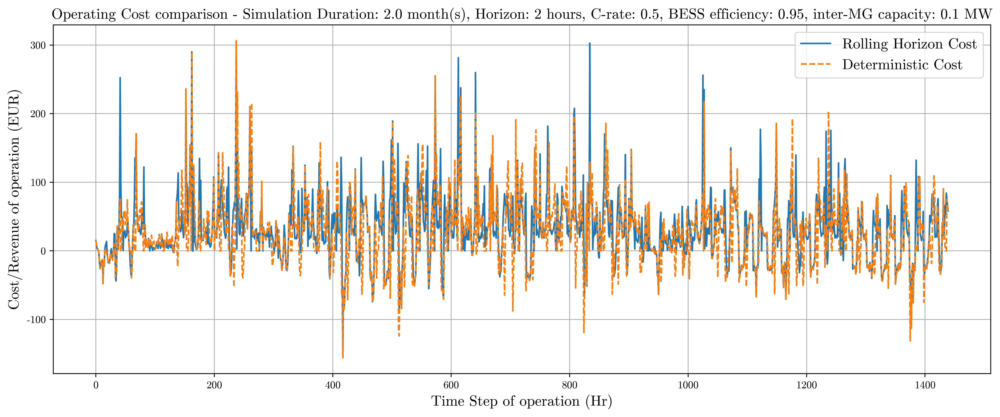

In [24]:

# Setting figure size
plt.figure(figsize=(16, 6), dpi=400)  # Adjust the values (width, height) as needed


# Plotting
plt.plot(rolling_horizon_costs, label='Rolling Horizon Cost', marker='None', linestyle='-')
plt.plot(total_deterministic_costs, label='Deterministic Cost', marker='None', linestyle='--')

plt.xlabel('Time Step of operation (Hr)', fontsize=14)
plt.ylabel('Cost/Revenue of operation (EUR)', fontsize=14)
plt.title(f'Operating Cost comparison - Simulation Duration: {SIMULATION_DURATION/(24*30)} month(s), Horizon: {HORIZON_LENGTH} hours, C-rate: {CHARGING_LIMIT}, BESS efficiency: {CHARGING_EFFICIENCY}, inter-MG capacity: {INTER_MICROGRID_LIMIT} MW', fontsize=14)
plt.legend(fontsize=14)
plt.grid(True)
plt.savefig(f'Simulation duration {SIMULATION_DURATION/(24*30)}, Horizon {HORIZON_LENGTH} hours, C-rate {CHARGING_LIMIT},BESS efficiency: {CHARGING_EFFICIENCY},{INTER_MICROGRID_LIMIT}.png')
plt.show()


In [55]:
import time
start_time = time.time()

# Constants
NUM_CONSUMERS = 3
SIMULATION_DURATION = 24*30*2
HORIZON_LENGTH = 6  # Planning horizon length in hours
INTER_MICROGRID_LIMIT = 0.1  # Inter-microgrid trading limit
PRICE_SPREAD = 0.05  # Price spread for trades
CHARGING_LIMIT = 0.5  # Battery charging limit
TRADE_COST_ENABLED = True  # Flag for enabling trade costs
UNCERTAINTY_SIGMA = 0.0  # Price/Demand/PV uncertainty
CHARGING_EFFICIENCY = 0.95  # Charging efficiency
eta=CHARGING_EFFICIENCY
SEED = 42  # Seed for random number generator


# Constants
NUM_CONSUMERS = 3
SIMULATION_DURATION = 24*3
HORIZON_LENGTH = 2 # Planning horizon length in hours
INTER_MICROGRID_LIMIT = 1  # Inter-microgrid trading limit
PRICE_SPREAD = 0.05  # Price spread for trades
CHARGING_LIMIT = 2 # Battery charging limit
TRADE_COST_ENABLED = True  # Flag for enabling trade costs
UNCERTAINTY_SIGMA = 0.0  # Price/Demand/PV uncertainty
CHARGING_EFFICIENCY = 0.95  # Charging efficiency
eta=CHARGING_EFFICIENCY


# Initialize random seed
np.random.seed(SEED)

# Data initialization
price_set = np.array(df_prices["Day-ahead Price [EUR/MWh]"].astype(float))
# Uncomment the next line if you want to replace negative prices with 5 EUR/MWh
# price_set = np.where(price_set < 0, 5, price_set)

# Initialize State of Charge (SOC)
max_capacity = np.array([PVavg[i + 1] * number_of_homes[i] * 1e-3 * 1.5 for i in range(NUM_CONSUMERS)])
current_SOC = max_capacity*0.1

print("Initial SOC:", current_SOC)
print("Max capacity:", max_capacity)

# Initialize simulation variables
total_rolling_horizon_cost = 0
rolling_horizon_costs = []

# Convert arrays to float to avoid typecasting issues later
demand_set = demand_list.astype(float)
PV_generation_set = PV_list.astype(float)

# Simulation loop
for hour in range(SIMULATION_DURATION):
    horizon_end = min(hour + HORIZON_LENGTH, SIMULATION_DURATION)

    demand_subset = demand_set[:, hour:horizon_end]
    PV_generation_subset = PV_generation_set[:, hour:horizon_end]
    price_subset = price_set[hour:horizon_end]

    try:
        total_sold, total_cost, total_battery_usage, current_cost, updated_SOC, cost_list, model = det_optimisation(
            INTER_MICROGRID_LIMIT, PRICE_SPREAD, CHARGING_LIMIT, TRADE_COST_ENABLED,
            demand_subset, PV_generation_subset, price_subset, horizon_end - hour, current_SOC, max_capacity, outputflag=0
        )
        current_SOC = updated_SOC[0]  # Update SOC for the next iteration
    except Exception as e:
        print(f"Optimization failed at hour {hour}: {e}")
        continue
    
    # Update costs and SOC for the next iteration
    rolling_horizon_costs.append(current_cost)
    total_rolling_horizon_cost += current_cost


# Data initialization
price_set = np.array(df_prices["Day-ahead Price [EUR/MWh]"].astype(float))
# Convert arrays to float to avoid typecasting issues later
demand_set = demand_list.astype(float)
PV_generation_set = PV_list.astype(float)

# Initialize State of Charge (SOC)
max_capacity = np.array([PVavg[i + 1] * number_of_homes[i] * 1e-3 * 1.5 for i in range(NUM_CONSUMERS)])
current_SOC = max_capacity*0.1



# Final aggregation and analysis
final_demand_subset = demand_set[:, :SIMULATION_DURATION]
final_PV_generation_subset = PV_generation_set[:, :SIMULATION_DURATION]
final_price_subset = price_set[:SIMULATION_DURATION]

total_sold, total_cost, total_battery_usage, final_cost, final_SOC, cost_list, model = det_optimisation(
    INTER_MICROGRID_LIMIT, PRICE_SPREAD, CHARGING_LIMIT, TRADE_COST_ENABLED,
    final_demand_subset, final_PV_generation_subset, final_price_subset, SIMULATION_DURATION, current_SOC, max_capacity, outputflag=0
)

print(f"Total rolling horizon cost: {total_rolling_horizon_cost}")
print(f"Deterministic cost: {total_cost}")


# Calculate and print the cost comparison
print(f"Printing determinstic/RH cost ratio: {(total_cost/total_rolling_horizon_cost)}")
print(F"Price difference between determinsitic and RH cost: {total_rolling_horizon_cost - total_cost}")


total_deterministic_costs = [sum(sublist) for sublist in cost_list]



# Your code here
elapsed_time = time.time() - start_time
print(f"Elapsed time: {elapsed_time} seconds")



Initial SOC: [0.036  0.081  0.4275]
Max capacity: [0.36  0.81  4.275]
Total rolling horizon cost: 1293.055834229395
Deterministic cost: 755.482263006906
Printing determinstic/RH cost ratio: 0.5842611301136432
Price difference between determinsitic and RH cost: 537.573571222489
Elapsed time: 1.3349380493164062 seconds


In [ ]:

# Setting figure size
plt.figure(figsize=(16, 6), dpi=400)  # Adjust the values (width, height) as needed


# Plotting
plt.plot(rolling_horizon_costs, label='Rolling Horizon Cost', marker='None', linestyle='-')
plt.plot(total_deterministic_costs, label='Deterministic Cost', marker='None', linestyle='--')

plt.xlabel('Time Step of operation (Hr)', fontsize=14)
plt.ylabel('Cost/Revenue of operation (EUR)', fontsize=14)
plt.title(f'Operating Cost comparison - Simulation Duration: {SIMULATION_DURATION/(24*30)} month(s), Horizon: {HORIZON_LENGTH} hours, C-rate: {CHARGING_LIMIT}, BESS efficiency: {CHARGING_EFFICIENCY}, inter-MG capacity: {INTER_MICROGRID_LIMIT} MW', fontsize=14)
plt.legend(fontsize=14)
plt.grid(True)
plt.savefig(f'Simulation duration {SIMULATION_DURATION/(24*30)}, Horizon {HORIZON_LENGTH} hours, C-rate {CHARGING_LIMIT},BESS efficiency: {CHARGING_EFFICIENCY},{INTER_MICROGRID_LIMIT}.png')
plt.show()


In [ ]:
x

## Assessing the impact of horizon length on computational time complexity and performance

In [83]:
import time

time_list = []
optimality_list = []
for horizon in range(2, 25, 2):
    start_time = time.time()

    # Constants
    NUM_CONSUMERS = 3
    SIMULATION_DURATION = 24*30*2
    HORIZON_LENGTH = horizon  # Planning horizon length in hours
    INTER_MICROGRID_LIMIT = 0.1  # Inter-microgrid trading limit
    PRICE_SPREAD = 0.05  # Price spread for trades
    CHARGING_LIMIT = 0.5  # Battery charging limit
    TRADE_COST_ENABLED = True  # Flag for enabling trade costs
    UNCERTAINTY_SIGMA = 0.0  # Price/Demand/PV uncertainty
    CHARGING_EFFICIENCY = 0.95  # Charging efficiency
    eta=CHARGING_EFFICIENCY
    SEED = 42  # Seed for random number generator

    # Initialize random seed
    np.random.seed(SEED)

    # Data initialization
    price_set = np.array(df_prices["Day-ahead Price [EUR/MWh]"].astype(float))
    # Uncomment the next line if you want to replace negative prices with 5 EUR/MWh
    # price_set = np.where(price_set < 0, 5, price_set)

    # Initialize State of Charge (SOC)
    max_capacity = np.array([PVavg[i + 1] * number_of_homes[i] * 1e-3 * 1.5 for i in range(NUM_CONSUMERS)])
    current_SOC = max_capacity*0.1


    # Initialize simulation variables
    total_rolling_horizon_cost = 0
    rolling_horizon_costs = []

    # Convert arrays to float to avoid typecasting issues later
    demand_set = demand_list.astype(float)
    PV_generation_set = PV_list.astype(float)

    # Simulation loop
    for hour in range(SIMULATION_DURATION):
        horizon_end = min(hour + HORIZON_LENGTH, SIMULATION_DURATION)

        demand_subset = demand_set[:, hour:horizon_end]
        PV_generation_subset = PV_generation_set[:, hour:horizon_end]
        price_subset = price_set[hour:horizon_end]

        try:
            total_sold, total_cost, total_battery_usage, current_cost, updated_SOC, cost_list, model = det_optimisation(
                INTER_MICROGRID_LIMIT, PRICE_SPREAD, CHARGING_LIMIT, TRADE_COST_ENABLED,
                demand_subset, PV_generation_subset, price_subset, horizon_end - hour, current_SOC, max_capacity, outputflag=0
            )
            current_SOC = updated_SOC[0]  # Update SOC for the next iteration
        except Exception as e:
            print(f"Optimization failed at hour {hour}: {e}")
            continue

        # Update costs and SOC for the next iteration
        rolling_horizon_costs.append(current_cost)
        total_rolling_horizon_cost += current_cost


    # Data initialization
    price_set = np.array(df_prices["Day-ahead Price [EUR/MWh]"].astype(float))
    # Convert arrays to float to avoid typecasting issues later
    demand_set = demand_list.astype(float)
    PV_generation_set = PV_list.astype(float)

    # Initialize State of Charge (SOC)
    max_capacity = np.array([PVavg[i + 1] * number_of_homes[i] * 1e-3 * 1.5 for i in range(NUM_CONSUMERS)])
    current_SOC = max_capacity*0.1



    # Final aggregation and analysis
    final_demand_subset = demand_set[:, :SIMULATION_DURATION]
    final_PV_generation_subset = PV_generation_set[:, :SIMULATION_DURATION]
    final_price_subset = price_set[:SIMULATION_DURATION]
    
    
    if horizon > 23:
        total_sold, total_cost, total_battery_usage, final_cost, final_SOC, cost_list, model = det_optimisation(
                INTER_MICROGRID_LIMIT, PRICE_SPREAD, CHARGING_LIMIT, TRADE_COST_ENABLED,
                final_demand_subset, final_PV_generation_subset, final_price_subset, SIMULATION_DURATION, current_SOC, max_capacity, outputflag=0
            )
        
        det_cost = total_cost
        print(f"Deterministic cost: {total_cost}")

        
    

    print(f"Horizon {horizon}")
    print(f"RH cost {total_rolling_horizon_cost}")

    # Calculate and print the cost comparison
    
   

    optimality_list.append(total_rolling_horizon_cost)



    # Your code here
    elapsed_time = time.time() - start_time
    
    time_list.append(elapsed_time)
    print(f"Elapsed time: {elapsed_time} seconds")



Horizon 2
RH cost 46993.59327325451
Elapsed time: 20.167293787002563 seconds
Horizon 4
RH cost 42366.71518296242
Elapsed time: 31.536041259765625 seconds
Horizon 6
RH cost 39748.12979039581
Elapsed time: 43.6668746471405 seconds
Horizon 8
RH cost 38764.087787994606
Elapsed time: 55.464048862457275 seconds
Horizon 10
RH cost 38405.12081418089
Elapsed time: 67.39930605888367 seconds
Horizon 12
RH cost 38250.954560238235
Elapsed time: 82.16169333457947 seconds
Horizon 14
RH cost 38200.12644714471
Elapsed time: 97.68131613731384 seconds
Horizon 16
RH cost 38188.20871348372
Elapsed time: 105.77352023124695 seconds
Horizon 18
RH cost 38169.84595855311
Elapsed time: 115.27392148971558 seconds
Horizon 20
RH cost 38156.57880684695
Elapsed time: 127.26467943191528 seconds
Horizon 22
RH cost 38151.63934531377
Elapsed time: 138.31740999221802 seconds
Deterministic cost: 38072.151798233666
Horizon 24
RH cost 38149.45695952395
Elapsed time: 154.09376311302185 seconds


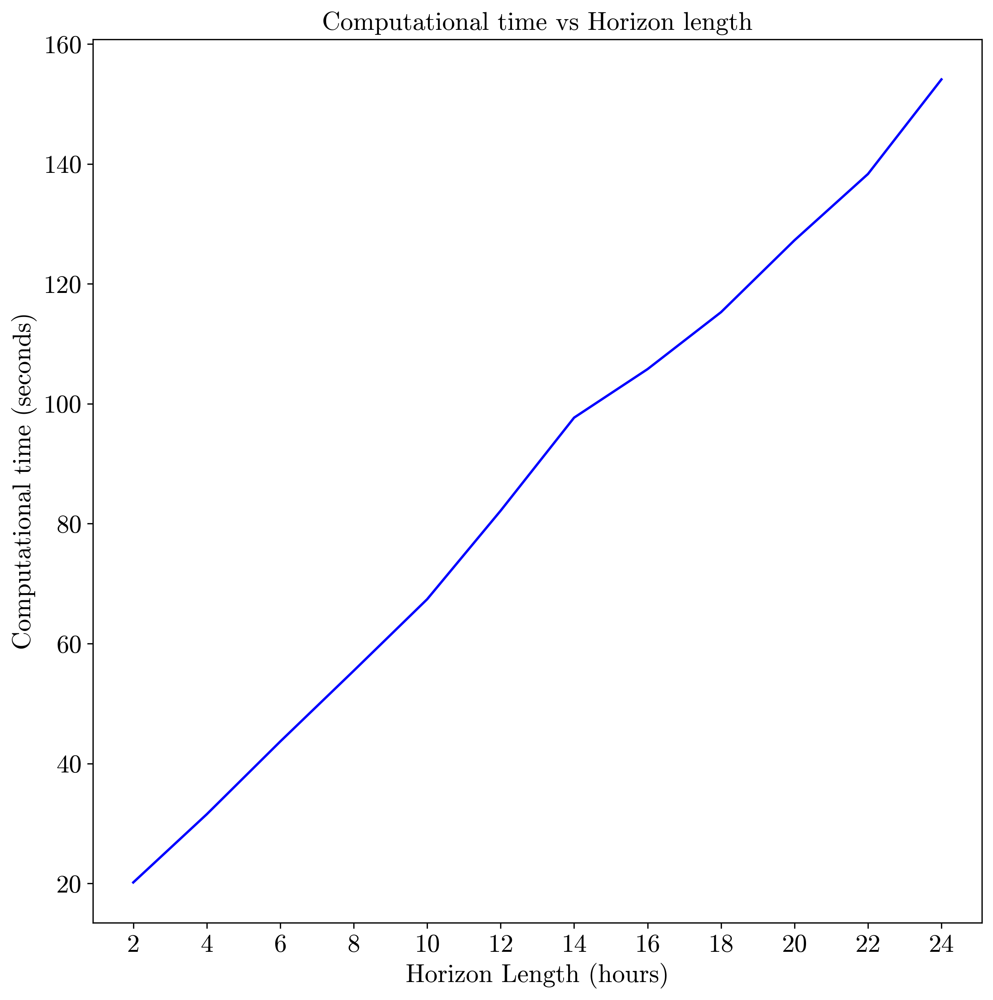

In [84]:
plt.figure(figsize=(10,10), dpi=300)
# Creating the scatter plot
plt.plot(list(range(2, 25, 2)), time_list, color='blue', label='Time Data')  # Plot with blue dots

plt.title('Computational time vs Horizon length', fontsize=16)
plt.xlabel('Horizon Length (hours)', fontsize=16)
plt.tick_params(axis='both', which='major', labelsize=16)  # Increase tick label size

plt.ylabel('Computational time (seconds)', fontsize=16)
plt.xticks(range(2, 25, 2))  # Ticks from 2 to 24, every 2 units
plt.savefig("computationaltime1.png")
plt.show()

In [87]:
optimality_list

[46993.59327325451,
 42366.71518296242,
 39748.12979039581,
 38764.087787994606,
 38405.12081418089,
 38250.954560238235,
 38200.12644714471,
 38188.20871348372,
 38169.84595855311,
 38156.57880684695,
 38151.63934531377,
 38149.45695952395]

In [89]:
optimality_gap = ( abs(det_cost - np.array(optimality_list))/np.array(optimality_list))*100
optimality_gap

array([18.9843782 , 10.13664469,  4.21649522,  1.78499232,  0.8669912 ,
        0.46744654,  0.33501106,  0.30390772,  0.25594591,  0.22126462,
        0.20834635,  0.20263765])

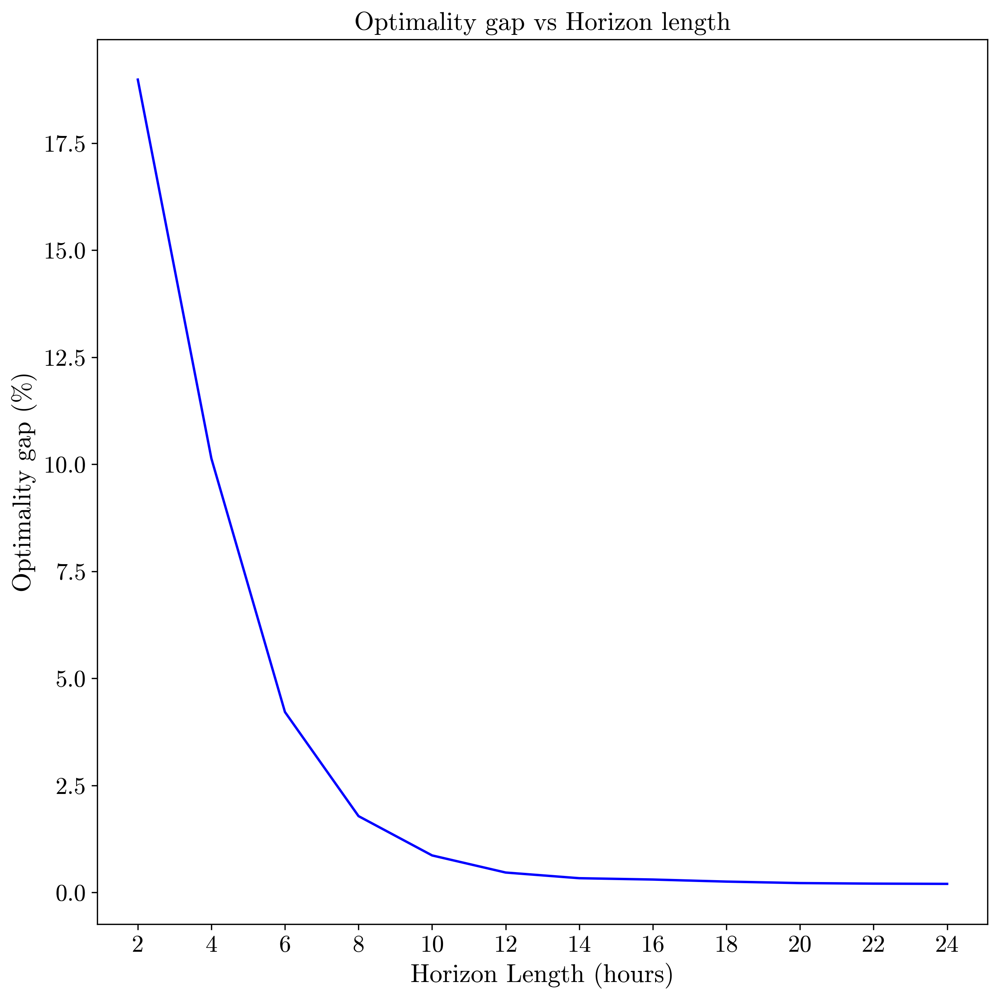

In [90]:
plt.figure(figsize=(10,10), dpi=300)
# Creating the scatter plot
plt.plot(list(range(2, 25, 2)), optimality_gap, color='blue', label='Time Data')  # Plot with blue dots
# Increasing tick size
plt.tick_params(axis='both', which='major', labelsize=15)  # Increase tick label size

plt.title('Optimality gap vs Horizon length', fontsize=16)
plt.xlabel('Horizon Length (hours)', fontsize=16)
plt.ylabel('Optimality gap (%)', fontsize=16)
plt.xticks(range(2, 25, 2))  # Ticks from 2 to 24, every 2 units

plt.savefig("optimalitygap1_simple.png")
plt.show()

In [ ]:
z = z/10000

# Assessing the impact of key model paramters on optimality.

## Eta and RH

In [91]:
import time


eta_list = np.linspace(0.80, 0.99, 12)#[0.80, 0.85, 0.90, 0.95, 0.99]
rh_cost_list = []
det_cost_list = []
for horizon in range(2, 9, 1):
    for eta in eta_list:
      

        # Constants
        NUM_CONSUMERS = 3
        SIMULATION_DURATION = 24*30
        HORIZON_LENGTH = horizon  # Planning horizon length in hours
        INTER_MICROGRID_LIMIT = 0.1  # Inter-microgrid trading limit
        PRICE_SPREAD = 0.05  # Price spread for trades
        CHARGING_LIMIT = 0.5  # Battery charging limit
        TRADE_COST_ENABLED = True  # Flag for enabling trade costs
        UNCERTAINTY_SIGMA = 0.0  # Price/Demand/PV uncertainty
        CHARGING_EFFICIENCY = eta # Charging efficiency
        eta=CHARGING_EFFICIENCY
        SEED = 42  # Seed for random number generator

        # Initialize random seed
        np.random.seed(SEED)

        # Data initialization
        price_set = np.array(df_prices["Day-ahead Price [EUR/MWh]"].astype(float))
        # Uncomment the next line if you want to replace negative prices with 5 EUR/MWh
        # price_set = np.where(price_set < 0, 5, price_set)

        # Initialize State of Charge (SOC)
        max_capacity = np.array([PVavg[i + 1] * number_of_homes[i] * 1e-3 * 1.5 for i in range(NUM_CONSUMERS)])
        current_SOC = max_capacity*0.1


        # Initialize simulation variables
        total_rolling_horizon_cost = 0
        rolling_horizon_costs = []

        # Convert arrays to float to avoid typecasting issues later
        demand_set = demand_list.astype(float)
        PV_generation_set = PV_list.astype(float)

        # Simulation loop
        for hour in range(SIMULATION_DURATION):
            horizon_end = min(hour + HORIZON_LENGTH, SIMULATION_DURATION)

            demand_subset = demand_set[:, hour:horizon_end]
            PV_generation_subset = PV_generation_set[:, hour:horizon_end]
            price_subset = price_set[hour:horizon_end]

            try:
                total_sold, total_cost, total_battery_usage, current_cost, updated_SOC, cost_list, model = det_optimisation(
                    INTER_MICROGRID_LIMIT, PRICE_SPREAD, CHARGING_LIMIT, TRADE_COST_ENABLED,
                    demand_subset, PV_generation_subset, price_subset, horizon_end - hour, current_SOC, max_capacity, outputflag=0
                )
                current_SOC = updated_SOC[0]  # Update SOC for the next iteration
            except Exception as e:
                print(f"Optimization failed at hour {hour}: {e}")
                continue

            # Update costs and SOC for the next iteration
            rolling_horizon_costs.append(current_cost)
            total_rolling_horizon_cost += current_cost


        # Data initialization
        price_set = np.array(df_prices["Day-ahead Price [EUR/MWh]"].astype(float))
        # Convert arrays to float to avoid typecasting issues later
        demand_set = demand_list.astype(float)
        PV_generation_set = PV_list.astype(float)

        # Initialize State of Charge (SOC)
        max_capacity = np.array([PVavg[i + 1] * number_of_homes[i] * 1e-3 * 1.5 for i in range(NUM_CONSUMERS)])
        current_SOC = max_capacity*0.1



        # Final aggregation and analysis
        final_demand_subset = demand_set[:, :SIMULATION_DURATION]
        final_PV_generation_subset = PV_generation_set[:, :SIMULATION_DURATION]
        final_price_subset = price_set[:SIMULATION_DURATION]


        if horizon == 8:
            total_sold, total_cost, total_battery_usage, final_cost, final_SOC, cost_list, model = det_optimisation(
                    INTER_MICROGRID_LIMIT, PRICE_SPREAD, CHARGING_LIMIT, TRADE_COST_ENABLED,
                    final_demand_subset, final_PV_generation_subset, final_price_subset, SIMULATION_DURATION, current_SOC, max_capacity, outputflag=0
                )

            det_cost = total_cost
            det_cost_list.append(det_cost)
          



      

        # Calculate and print the cost comparison



        rh_cost_list.append((horizon,eta, total_rolling_horizon_cost))




In [98]:
#rh_cost_array = np.array(rh_cost_list, dtype=[('horizon', float), ('eta', float), ('cost', float)])
efficiencies = np.linspace(0.80, 0.99, 12)
det_cost_dict = dict(zip(efficiencies, det_cost_list))

In [99]:
det_cost_dict

{0.8: 23826.555522995845,
 0.8172727272727273: 23672.759306716773,
 0.8345454545454546: 23496.46300120371,
 0.8518181818181818: 23305.824021918033,
 0.8690909090909091: 23097.650023126538,
 0.8863636363636364: 22867.821124494407,
 0.9036363636363637: 22617.758836389356,
 0.9209090909090909: 22347.57090134854,
 0.9381818181818182: 22058.750519145164,
 0.9554545454545454: 21749.68736646774,
 0.9727272727272728: 21416.77366622906,
 0.99: 21064.14602763842}

In [94]:
rh_cost_array = np.array(rh_cost_list, dtype=[('horizon', float), ('eta', float), ('cost', float)])

In [ ]:
eta_grid

In [95]:
# Extracting the data columns for plotting
horizons = rh_cost_array['horizon']
etas = rh_cost_array['eta']
costs = rh_cost_array['cost']


# Create grid coordinates
horizon_grid = np.linspace(horizons.min(), horizons.max(), 20)  # You can adjust the density of points here
eta_grid = np.linspace(etas.min(), etas.max(), 20)
horizon_mesh, eta_mesh = np.meshgrid(horizon_grid, eta_grid)

# Interpolate costs
cost_mesh = griddata((horizons, etas), costs, (horizon_mesh, eta_mesh), method='cubic')


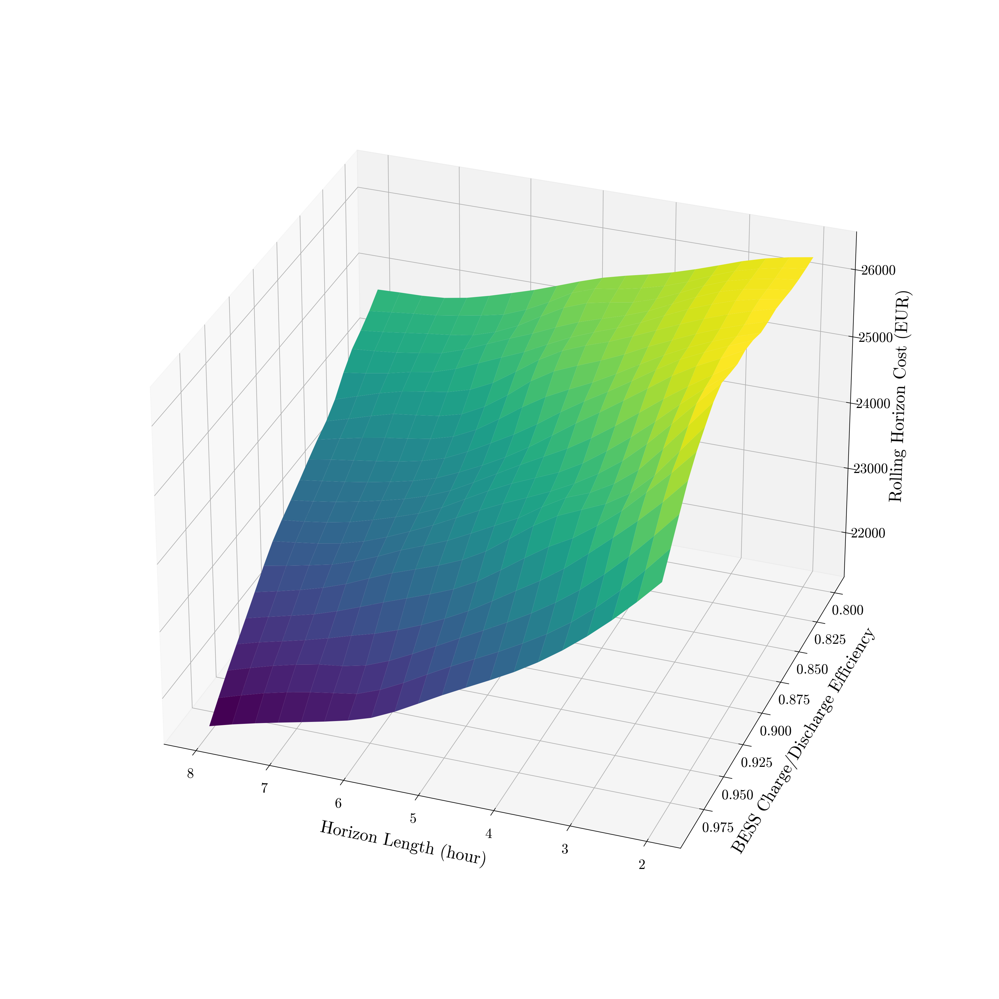

In [96]:
# Create the plot
fig = plt.figure(figsize=(24,18), dpi=200)
ax = fig.add_subplot(111, projection='3d')
fig.tight_layout()

# Surface plot
surface = ax.plot_surface(horizon_mesh, eta_mesh, cost_mesh, cmap='viridis', edgecolor='none')
plt.tick_params(axis='both', which='major', labelsize=18)  # Increase tick label size
ax.tick_params(axis='x', pad=10)  # Adds padding to the x-axis tick labels
ax.tick_params(axis='y', pad=10)  # Adds padding to the y-axis tick labels
ax.tick_params(axis='z', pad=15)  # Adds padding to the z-axis tick labels
ax.set_box_aspect(None, zoom=0.85)
# Adding labels
ax.set_xlabel('Horizon Length (hour)', fontsize=22 ,labelpad=30)
ax.set_ylabel('BESS Charge/Discharge Efficiency',  labelpad=30,fontsize=22)
ax.set_zlabel('Rolling Horizon Cost (EUR)', fontsize=22, labelpad=30)
ax.view_init(elev=30, azim=110) 

# Show the plot
fig.savefig('cost_hl_eta_and_det.png', bbox_inches='tight')

plt.show()


In [101]:
import statsmodels.api as sm

# Assuming 'horizons', 'etas', and 'costs' are available as lists or numpy arrays
horizons = rh_cost_array['horizon']
etas = rh_cost_array['eta']
costs = rh_cost_array['cost']

# Construct the independent variables matrix (include an intercept column)
X = sm.add_constant(np.column_stack((horizons, etas)))

# Create the model
model = sm.OLS(costs, X)

# Fit the model
results = model.fit()

# Print the results
print(results.summary())


                            OLS Regression Results                            
Dep. Variable:                      y   R-squared:                       0.933
Model:                            OLS   Adj. R-squared:                  0.931
Method:                 Least Squares   F-statistic:                     560.7
Date:                Wed, 17 Apr 2024   Prob (F-statistic):           3.57e-48
Time:                        18:45:09   Log-Likelihood:                -609.68
No. Observations:                  84   AIC:                             1225.
Df Residuals:                      81   BIC:                             1233.
Df Model:                           2                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const       3.911e+04    581.985     67.202      0.0

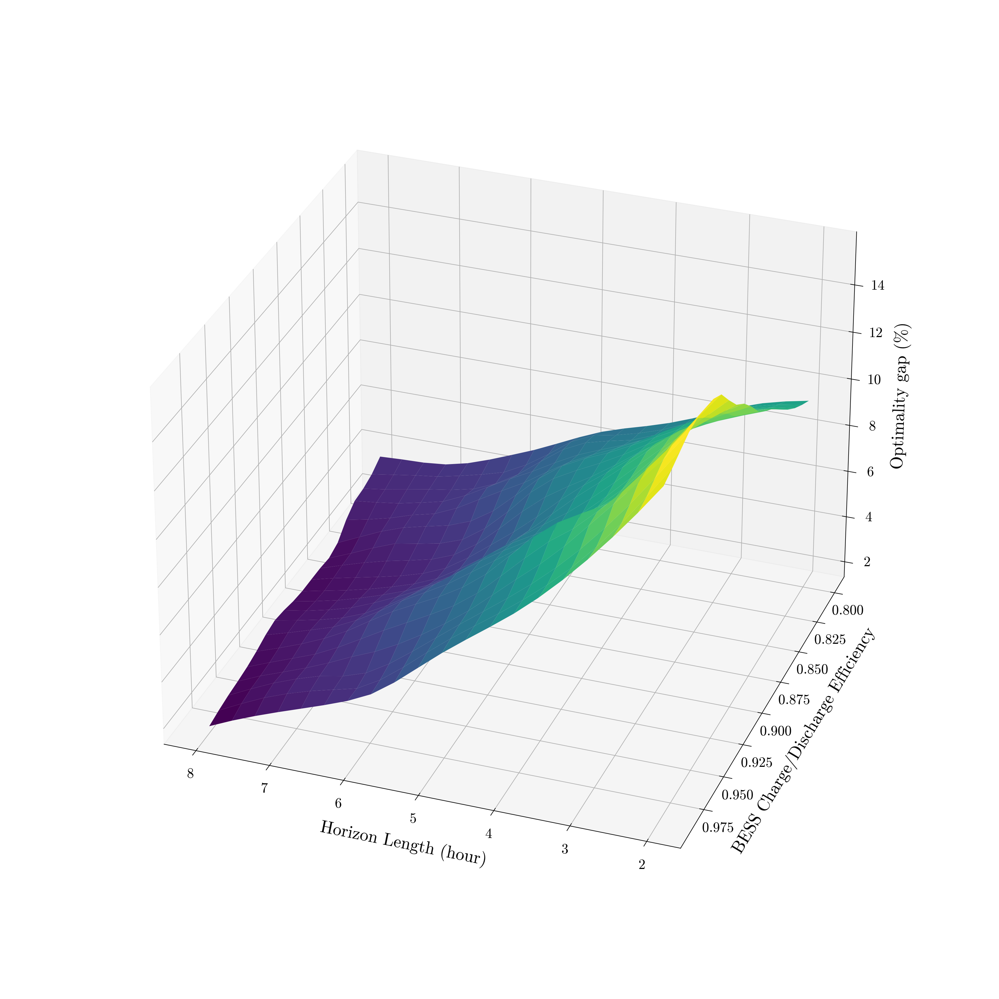

In [100]:
# Calculate the new RH costs divided by the corresponding deterministic cost
new_rh_cost_list = [(horizon, eta, abs(det_cost_dict[eta]-rh_cost) / rh_cost ) for (horizon, eta, rh_cost) in rh_cost_list]

optimality_array = np.array(new_rh_cost_list, dtype=[('horizon', float), ('eta', float), ('optimality', float)])

horizons = optimality_array['horizon']
etas = optimality_array['eta']
costs = optimality_array['optimality']*100


# Create grid coordinates
horizon_grid = np.linspace(horizons.min(), horizons.max(), 20)  # You can adjust the density of points here
eta_grid = np.linspace(etas.min(), etas.max(), 20)
horizon_mesh, eta_mesh = np.meshgrid(horizon_grid, eta_grid)

# Interpolate costs
cost_mesh = griddata((horizons, etas), costs, (horizon_mesh, eta_mesh), method='cubic')


# Create the plot
fig = plt.figure(figsize=(24,18), dpi=200)
ax = fig.add_subplot(111, projection='3d')
fig.tight_layout()

# Surface plot
surface = ax.plot_surface(horizon_mesh, eta_mesh, cost_mesh, cmap='viridis', edgecolor='none')
plt.tick_params(axis='both', which='major', labelsize=18)  # Increase tick label size
ax.tick_params(axis='x', pad=10)  # Adds padding to the x-axis tick labels
ax.tick_params(axis='y', pad=10)  # Adds padding to the y-axis tick labels
ax.tick_params(axis='z', pad=15)  # Adds padding to the z-axis tick labels
ax.set_box_aspect(None, zoom=0.85)
# Adding labels
ax.set_xlabel('Horizon Length (hour)', fontsize=22 ,labelpad=30)
ax.set_ylabel('BESS Charge/Discharge Efficiency',  labelpad=30,fontsize=22)
ax.set_zlabel('Optimality gap (%)', fontsize=22, labelpad=30)
ax.view_init(elev=30, azim=110) 
# Show the plot
fig.savefig('optimality_hl_eta.png', bbox_inches='tight')

plt.show()


In [102]:


horizons = optimality_array['horizon']
etas = optimality_array['eta']
costs = optimality_array['optimality']*100

# Construct the independent variables matrix (include an intercept column)
X = sm.add_constant(np.column_stack((horizons, etas)))

# Create the model
model = sm.OLS(costs, X)

# Fit the model
results = model.fit()

# Print the results
print(results.summary())


                            OLS Regression Results                            
Dep. Variable:                      y   R-squared:                       0.920
Model:                            OLS   Adj. R-squared:                  0.918
Method:                 Least Squares   F-statistic:                     463.1
Date:                Wed, 17 Apr 2024   Prob (F-statistic):           4.66e-45
Time:                        18:45:52   Log-Likelihood:                -127.62
No. Observations:                  84   AIC:                             261.2
Df Residuals:                      81   BIC:                             268.5
Df Model:                           2                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const         10.8005      1.873      5.766      0.0

In [ ]:
#rh_cost_array = np.array(rh_cost_list, dtype=[('horizon', float), ('eta', float), ('cost', float)])
efficiencies = [0.80, 0.85, 0.90, 0.95, 0.99]
det_cost_dict = dict(zip(efficiencies, det_cost_list))

In [ ]:
det_cost_dict

## eta and C-rate

### 2 weeks

In [103]:
import time


eta_list = [0.80, 0.85, 0.90, 0.95, 0.99]
C_rate_list = np.linspace(0,1.5,6)
rh_cost_list = []
det_cost_list = []
for Cr in C_rate_list:
    print(Cr)
    for eta in eta_list:
        

        # Constants
        NUM_CONSUMERS = 3
        SIMULATION_DURATION = 24*2*7
        HORIZON_LENGTH = 6  # Planning horizon length in hours
        INTER_MICROGRID_LIMIT = 0.1  # Inter-microgrid trading limit
        PRICE_SPREAD = 0.05  # Price spread for trades
        CHARGING_LIMIT = Cr  # Battery charging limit
        TRADE_COST_ENABLED = True  # Flag for enabling trade costs
        UNCERTAINTY_SIGMA = 0.0  # Price/Demand/PV uncertainty
        CHARGING_EFFICIENCY = eta # Charging efficiency
        eta=CHARGING_EFFICIENCY
        SEED = 42  # Seed for random number generator

        # Initialize random seed
        np.random.seed(SEED)

        # Data initialization
        price_set = np.array(df_prices["Day-ahead Price [EUR/MWh]"].astype(float))
        # Uncomment the next line if you want to replace negative prices with 5 EUR/MWh
        # price_set = np.where(price_set < 0, 5, price_set)

        # Initialize State of Charge (SOC)
        max_capacity = np.array([PVavg[i + 1] * number_of_homes[i] * 1e-3 * 1.5 for i in range(NUM_CONSUMERS)])
        current_SOC = max_capacity*0.1


        # Initialize simulation variables
        total_rolling_horizon_cost = 0
        rolling_horizon_costs = []

        # Convert arrays to float to avoid typecasting issues later
        demand_set = demand_list.astype(float)
        PV_generation_set = PV_list.astype(float)

        # Simulation loop
        for hour in range(SIMULATION_DURATION):
            horizon_end = min(hour + HORIZON_LENGTH, SIMULATION_DURATION)

            demand_subset = demand_set[:, hour:horizon_end]
            PV_generation_subset = PV_generation_set[:, hour:horizon_end]
            price_subset = price_set[hour:horizon_end]

            try:
                total_sold, total_cost, total_battery_usage, current_cost, updated_SOC, cost_list, model = det_optimisation(
                    INTER_MICROGRID_LIMIT, PRICE_SPREAD, CHARGING_LIMIT, TRADE_COST_ENABLED,
                    demand_subset, PV_generation_subset, price_subset, horizon_end - hour, current_SOC, max_capacity, outputflag=0
                )
                current_SOC = updated_SOC[0]  # Update SOC for the next iteration
            except Exception as e:
                print(f"Optimization failed at hour {hour}: {e}")
                continue

            # Update costs and SOC for the next iteration
            rolling_horizon_costs.append(current_cost)
            total_rolling_horizon_cost += current_cost


        # Data initialization
        price_set = np.array(df_prices["Day-ahead Price [EUR/MWh]"].astype(float))
        # Convert arrays to float to avoid typecasting issues later
        demand_set = demand_list.astype(float)
        PV_generation_set = PV_list.astype(float)

        # Initialize State of Charge (SOC)
        max_capacity = np.array([PVavg[i + 1] * number_of_homes[i] * 1e-3 * 1.5 for i in range(NUM_CONSUMERS)])
        current_SOC = max_capacity*0.1



        # Final aggregation and analysis
        final_demand_subset = demand_set[:, :SIMULATION_DURATION]
        final_PV_generation_subset = PV_generation_set[:, :SIMULATION_DURATION]
        final_price_subset = price_set[:SIMULATION_DURATION]


        
        total_sold, total_cost, total_battery_usage, final_cost, final_SOC, cost_list, model = det_optimisation(
                    INTER_MICROGRID_LIMIT, PRICE_SPREAD, CHARGING_LIMIT, TRADE_COST_ENABLED,
                    final_demand_subset, final_PV_generation_subset, final_price_subset, SIMULATION_DURATION, current_SOC, max_capacity, outputflag=0
                )

        det_cost = total_cost
        det_cost_list.append(det_cost)
          



      

        # Calculate and print the cost comparison



        rh_cost_list.append((Cr,eta, total_rolling_horizon_cost,det_cost))




0.0
0.3
0.6
0.8999999999999999
1.2
1.5


Plotting

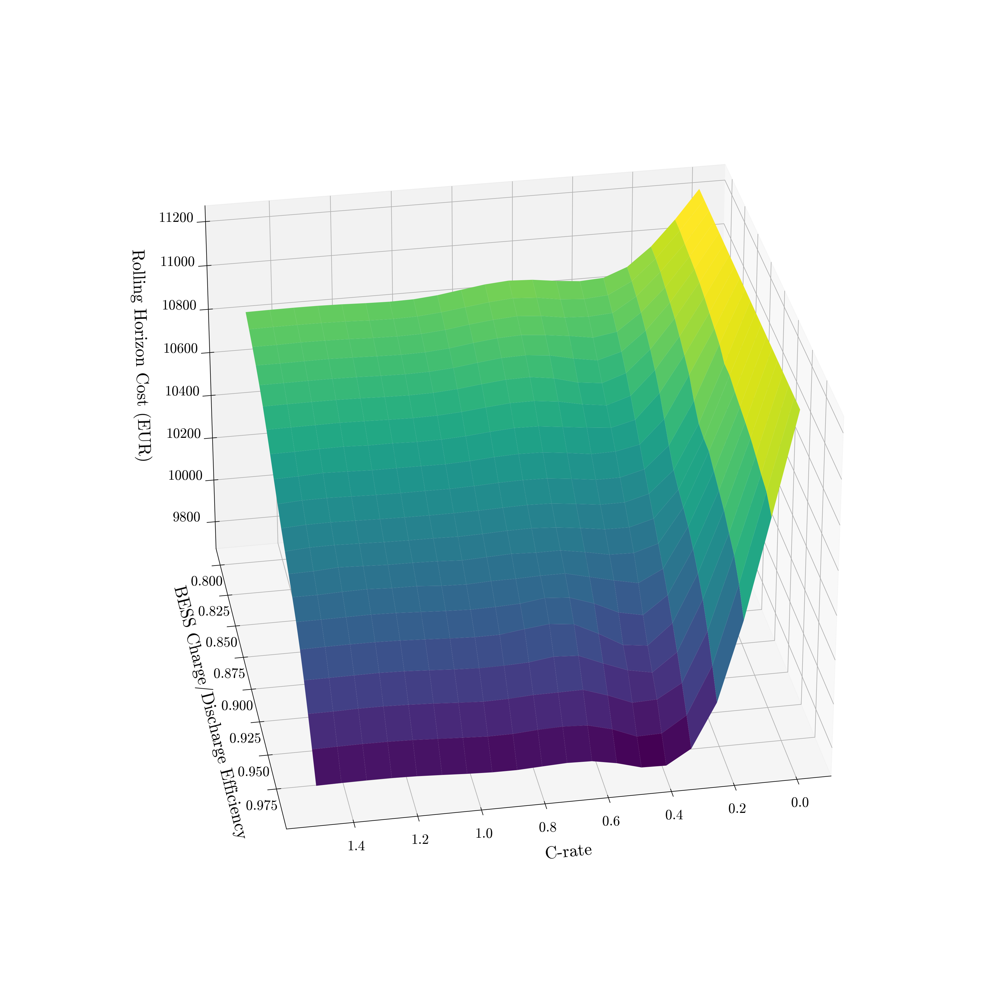

In [104]:
rh_cost_array = np.array(rh_cost_list, dtype=[('cr', float), ('eta', float), ('cost', float), ("det_cost", float)])

# Extracting the data columns for plotting
crate = rh_cost_array['cr']
etas = rh_cost_array['eta']
costs = rh_cost_array['cost']


# Create grid coordinates
crate_grid = np.linspace(crate.min(), crate.max(), 20)  # You can adjust the density of points here
eta_grid = np.linspace(etas.min(), etas.max(), 20)
crate_mesh, eta_mesh = np.meshgrid(crate_grid, eta_grid)

# Interpolate costs
cost_mesh = griddata((crate, etas), costs, (crate_mesh, eta_mesh), method='cubic')

# Create the plot
fig = plt.figure(figsize=(24,18), dpi=200)
ax = fig.add_subplot(111, projection='3d')
fig.tight_layout()

# Surface plot
surface = ax.plot_surface(crate_mesh, eta_mesh, cost_mesh, cmap='viridis', edgecolor='none')
plt.tick_params(axis='both', which='major', labelsize=18)  # Increase tick label size
ax.tick_params(axis='x', pad=10)  # Adds padding to the x-axis tick labels
ax.tick_params(axis='y', pad=10)  # Adds padding to the y-axis tick labels
ax.tick_params(axis='z', pad=25)  # Adds padding to the z-axis tick labels
ax.set_box_aspect(None, zoom=0.85)
# Adding labels
ax.set_xlabel('C-rate', fontsize=22 ,labelpad=30)
ax.set_ylabel('BESS Charge/Discharge Efficiency',  labelpad=30,fontsize=22)
ax.set_zlabel('Rolling Horizon Cost (EUR)', fontsize=22, labelpad=60)
ax.view_init(elev=30, azim=80) 

# Show the plot
fig.savefig('cost_crate_eta.png', bbox_inches='tight')

plt.show()



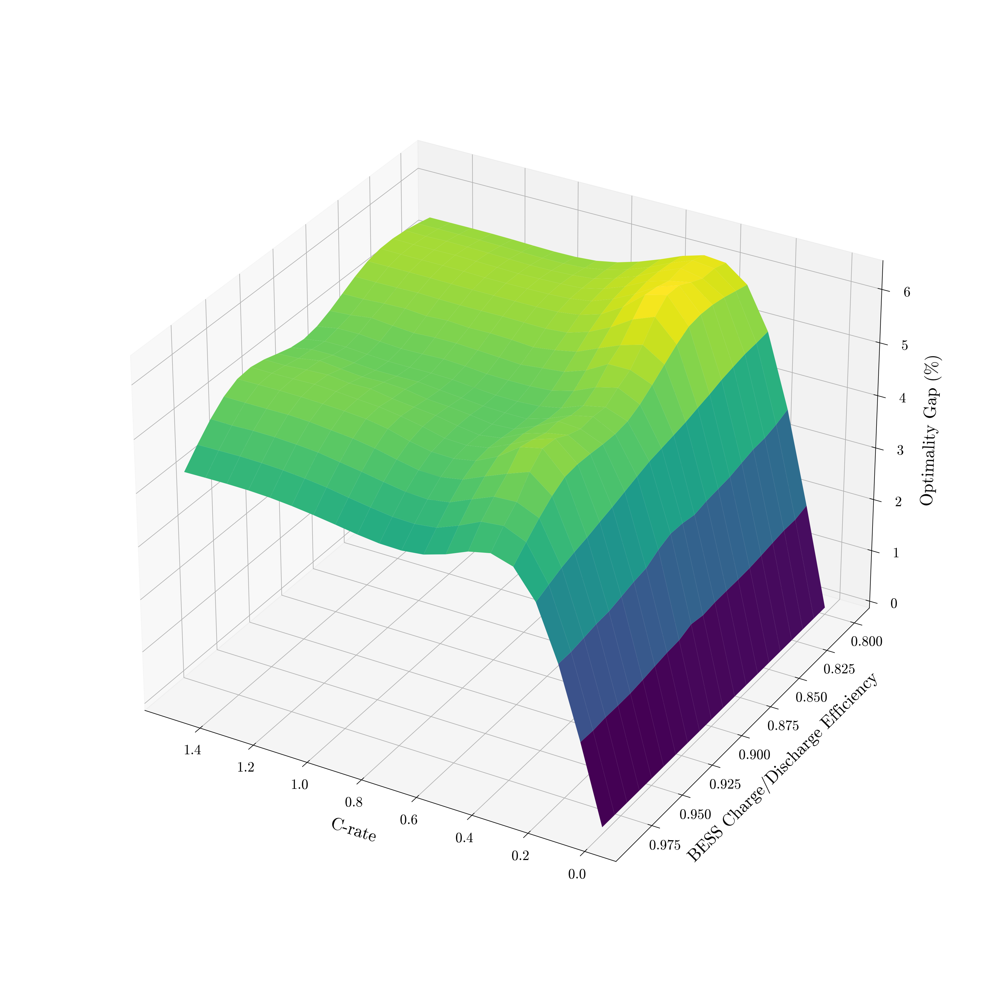

In [105]:

# Extracting the data columns for plotting
crate = rh_cost_array['cr']
etas = rh_cost_array['eta']
costs = (np.abs(np.array(rh_cost_array['det_cost'])-rh_cost_array['cost'])/np.array(rh_cost_array['det_cost']))*100


# Create grid coordinates
crate_grid = np.linspace(crate.min(), crate.max(), 20)  # You can adjust the density of points here
eta_grid = np.linspace(etas.min(), etas.max(), 20)
crate_mesh, eta_mesh = np.meshgrid(crate_grid, eta_grid)

# Interpolate costs
cost_mesh = griddata((crate, etas), costs, (crate_mesh, eta_mesh), method='cubic')


# Create the plot
fig = plt.figure(figsize=(24,18), dpi=200)
ax = fig.add_subplot(111, projection='3d')
fig.tight_layout()

# Surface plot
surface = ax.plot_surface(crate_mesh, eta_mesh, cost_mesh, cmap='viridis', edgecolor='none')
plt.tick_params(axis='both', which='major', labelsize=18)  # Increase tick label size
ax.tick_params(axis='x', pad=10)  # Adds padding to the x-axis tick labels
ax.tick_params(axis='y', pad=10)  # Adds padding to the y-axis tick labels
ax.tick_params(axis='z', pad=15)  # Adds padding to the z-axis tick labels
ax.set_box_aspect(None, zoom=0.85)
# Adding labels
ax.set_xlabel('C-rate', fontsize=22 ,labelpad=30)
ax.set_ylabel('BESS Charge/Discharge Efficiency',  labelpad=30,fontsize=22)
ax.set_zlabel('Optimality Gap (%)', fontsize=22, labelpad=30)
ax.view_init(elev=30, azim=120) 

# Show the plot
fig.savefig('optim_crate_eta.png', bbox_inches='tight')

plt.show()

### 2 months

In [106]:
eta_list = [0.80, 0.85, 0.90, 0.95, 0.99]
C_rate_list = np.linspace(0,2,8)
rh_cost_list = []
det_cost_list = []
for Cr in C_rate_list:
    print(Cr)
    for eta in eta_list:
        

        # Constants
        NUM_CONSUMERS = 3
        SIMULATION_DURATION = 24*30*2
        HORIZON_LENGTH = 3  # Planning horizon length in hours
        INTER_MICROGRID_LIMIT = 0.1  # Inter-microgrid trading limit
        PRICE_SPREAD = 0.05  # Price spread for trades
        CHARGING_LIMIT = Cr  # Battery charging limit
        TRADE_COST_ENABLED = True  # Flag for enabling trade costs
        UNCERTAINTY_SIGMA = 0.0  # Price/Demand/PV uncertainty
        CHARGING_EFFICIENCY = eta # Charging efficiency
        eta=CHARGING_EFFICIENCY
        SEED = 42  # Seed for random number generator

        # Initialize random seed
        np.random.seed(SEED)

        # Data initialization
        price_set = np.array(df_prices["Day-ahead Price [EUR/MWh]"].astype(float))
        # Uncomment the next line if you want to replace negative prices with 5 EUR/MWh
        # price_set = np.where(price_set < 0, 5, price_set)

        # Initialize State of Charge (SOC)
        max_capacity = np.array([PVavg[i + 1] * number_of_homes[i] * 1e-3 * 1.5 for i in range(NUM_CONSUMERS)])
        current_SOC = max_capacity*0.1


        # Initialize simulation variables
        total_rolling_horizon_cost = 0
        rolling_horizon_costs = []

        # Convert arrays to float to avoid typecasting issues later
        demand_set = demand_list.astype(float)
        PV_generation_set = PV_list.astype(float)

        # Simulation loop
        for hour in range(SIMULATION_DURATION):
            horizon_end = min(hour + HORIZON_LENGTH, SIMULATION_DURATION)

            demand_subset = demand_set[:, hour:horizon_end]
            PV_generation_subset = PV_generation_set[:, hour:horizon_end]
            price_subset = price_set[hour:horizon_end]

            try:
                total_sold, total_cost, total_battery_usage, current_cost, updated_SOC, cost_list, model = det_optimisation(
                    INTER_MICROGRID_LIMIT, PRICE_SPREAD, CHARGING_LIMIT, TRADE_COST_ENABLED,
                    demand_subset, PV_generation_subset, price_subset, horizon_end - hour, current_SOC, max_capacity, outputflag=0
                )
                current_SOC = updated_SOC[0]  # Update SOC for the next iteration
            except Exception as e:
                print(f"Optimization failed at hour {hour}: {e}")
                continue

            # Update costs and SOC for the next iteration
            rolling_horizon_costs.append(current_cost)
            total_rolling_horizon_cost += current_cost


        # Data initialization
        price_set = np.array(df_prices["Day-ahead Price [EUR/MWh]"].astype(float))
        # Convert arrays to float to avoid typecasting issues later
        demand_set = demand_list.astype(float)
        PV_generation_set = PV_list.astype(float)

        # Initialize State of Charge (SOC)
        max_capacity = np.array([PVavg[i + 1] * number_of_homes[i] * 1e-3 * 1.5 for i in range(NUM_CONSUMERS)])
        current_SOC = max_capacity*0.1



        # Final aggregation and analysis
        final_demand_subset = demand_set[:, :SIMULATION_DURATION]
        final_PV_generation_subset = PV_generation_set[:, :SIMULATION_DURATION]
        final_price_subset = price_set[:SIMULATION_DURATION]


        
        total_sold, total_cost, total_battery_usage, final_cost, final_SOC, cost_list, model = det_optimisation(
                    INTER_MICROGRID_LIMIT, PRICE_SPREAD, CHARGING_LIMIT, TRADE_COST_ENABLED,
                    final_demand_subset, final_PV_generation_subset, final_price_subset, SIMULATION_DURATION, current_SOC, max_capacity, outputflag=0
                )

        det_cost = total_cost
        det_cost_list.append(det_cost)
          



      

        # Calculate and print the cost comparison



        rh_cost_list.append((Cr,eta, total_rolling_horizon_cost,det_cost))




0.0
0.2857142857142857
0.5714285714285714
0.8571428571428571
1.1428571428571428
1.4285714285714284
1.7142857142857142
2.0


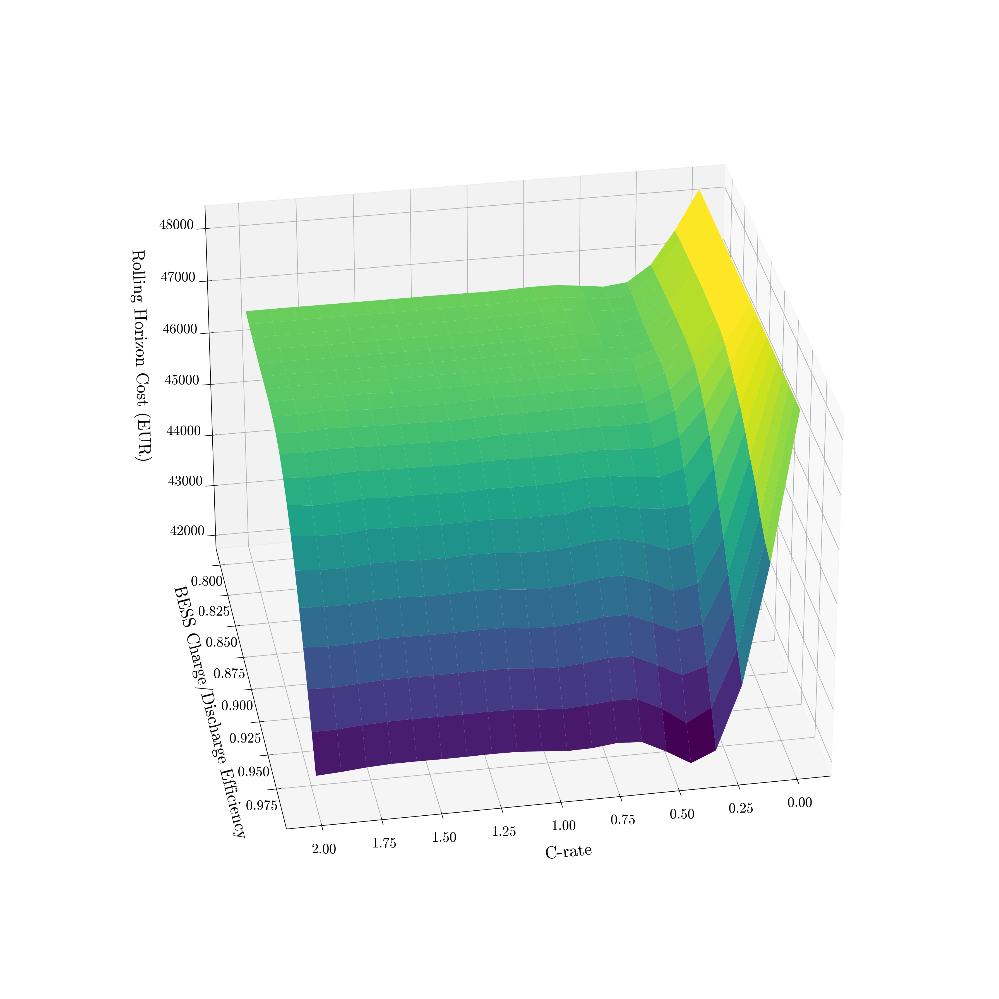

In [109]:
rh_cost_array = np.array(rh_cost_list, dtype=[('cr', float), ('eta', float), ('cost', float), ("det_cost", float)])

# Extracting the data columns for plotting
crate = rh_cost_array['cr']
etas = rh_cost_array['eta']
costs = rh_cost_array['cost']


# Create grid coordinates
crate_grid = np.linspace(crate.min(), crate.max(), 20)  # You can adjust the density of points here
eta_grid = np.linspace(etas.min(), etas.max(), 20)
crate_mesh, eta_mesh = np.meshgrid(crate_grid, eta_grid)

# Interpolate costs
cost_mesh = griddata((crate, etas), costs, (crate_mesh, eta_mesh), method='cubic')

# Create the plot
fig = plt.figure(figsize=(24,18), dpi=200)
ax = fig.add_subplot(111, projection='3d')
fig.tight_layout()

# Surface plot
surface = ax.plot_surface(crate_mesh, eta_mesh, cost_mesh, cmap='viridis', edgecolor='none')
plt.tick_params(axis='both', which='major', labelsize=18)  # Increase tick label size
ax.tick_params(axis='x', pad=10)  # Adds padding to the x-axis tick labels
ax.tick_params(axis='y', pad=10)  # Adds padding to the y-axis tick labels
ax.tick_params(axis='z', pad=25)  # Adds padding to the z-axis tick labels
ax.set_box_aspect(None, zoom=0.85)
# Adding labels
ax.set_xlabel('C-rate', fontsize=22 ,labelpad=30)
ax.set_ylabel('BESS Charge/Discharge Efficiency',  labelpad=30,fontsize=22)
ax.set_zlabel('Rolling Horizon Cost (EUR)', fontsize=22, labelpad=60)
ax.view_init(elev=30, azim=80) 

# Show the plot
fig.savefig('cost_crate_eta_2months.png', bbox_inches='tight')

plt.show()



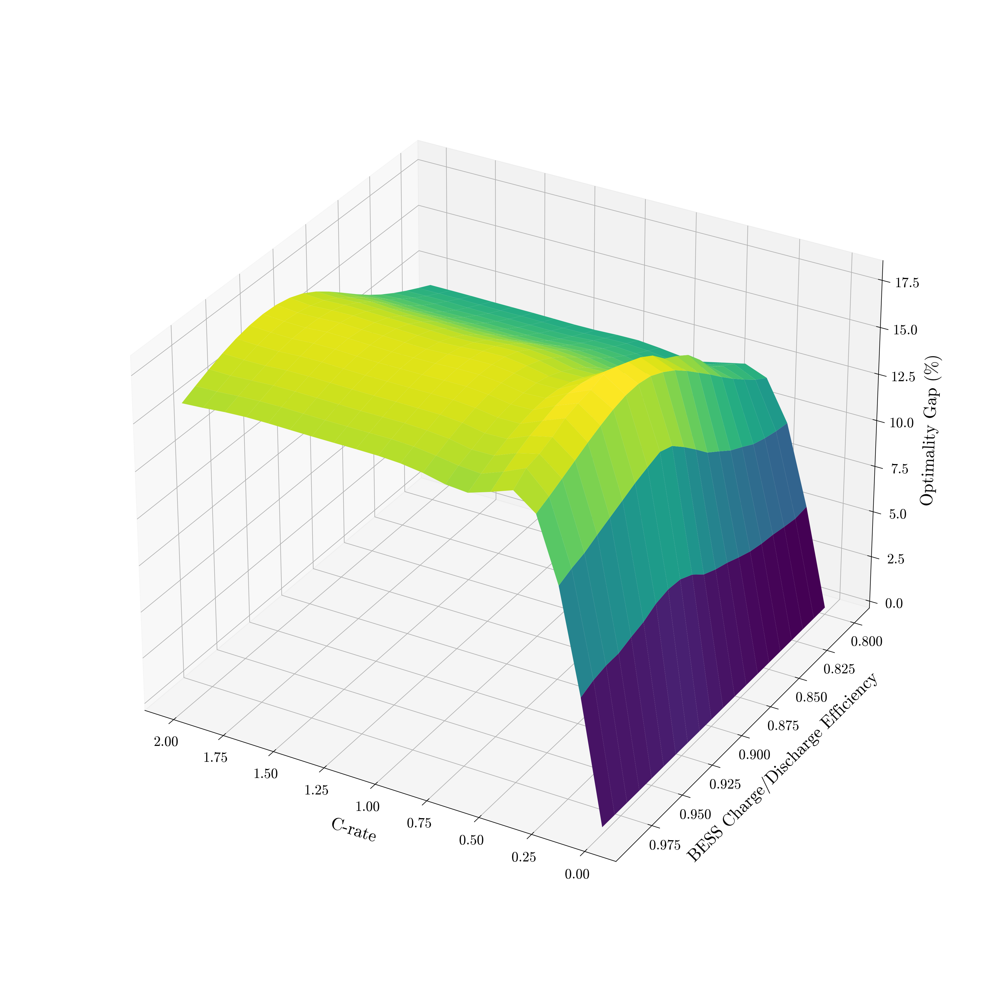

In [110]:

# Extracting the data columns for plotting
crate = rh_cost_array['cr']
etas = rh_cost_array['eta']
costs = (np.abs(np.array(rh_cost_array['det_cost'])-rh_cost_array['cost'])/np.array(rh_cost_array['det_cost']))*100



# Create grid coordinates
crate_grid = np.linspace(crate.min(), crate.max(), 20)  # You can adjust the density of points here
eta_grid = np.linspace(etas.min(), etas.max(), 20)
crate_mesh, eta_mesh = np.meshgrid(crate_grid, eta_grid)

# Interpolate costs
cost_mesh = griddata((crate, etas), costs, (crate_mesh, eta_mesh), method='cubic')


# Create the plot
fig = plt.figure(figsize=(24,18), dpi=200)
ax = fig.add_subplot(111, projection='3d')
fig.tight_layout()

# Surface plot
surface = ax.plot_surface(crate_mesh, eta_mesh, cost_mesh, cmap='viridis', edgecolor='none')
plt.tick_params(axis='both', which='major', labelsize=18)  # Increase tick label size
ax.tick_params(axis='x', pad=10)  # Adds padding to the x-axis tick labels
ax.tick_params(axis='y', pad=10)  # Adds padding to the y-axis tick labels
ax.tick_params(axis='z', pad=15)  # Adds padding to the z-axis tick labels
ax.set_box_aspect(None, zoom=0.85)
# Adding labels
ax.set_xlabel('C-rate', fontsize=22 ,labelpad=30)
ax.set_ylabel('BESS Charge/Discharge Efficiency',  labelpad=30,fontsize=22)
ax.set_zlabel('Optimality Gap (%)', fontsize=22, labelpad=30)
ax.view_init(elev=30, azim=120) 

# Show the plot
fig.savefig('optim_crate_eta_2months.png', bbox_inches='tight')

plt.show()

In [ ]:
np.median(demand_list)

## Impact of $EMG_{max}$ on cost and optimality

In [ ]:

emg_list = [0, 1]
rh_cost_list = []
det_cost_list = []
for emg in emg_list:
  
    
        # Constants
        NUM_CONSUMERS = 3
        SIMULATION_DURATION = 24*30*12
        HORIZON_LENGTH = 12  # Planning horizon length in hours
        INTER_MICROGRID_LIMIT = emg # Inter-microgrid trading limit
        PRICE_SPREAD = 0.05  # Price spread for trades
        CHARGING_LIMIT = Cr  # Battery charging limit
        TRADE_COST_ENABLED = True  # Flag for enabling trade costs
        UNCERTAINTY_SIGMA = 0.0  # Price/Demand/PV uncertainty
        CHARGING_EFFICIENCY = 0.95 # Charging efficiency
        eta=CHARGING_EFFICIENCY
        SEED = 42  # Seed for random number generator

        # Initialize random seed
        np.random.seed(SEED)

        # Data initialization
        price_set = np.array(df_prices["Day-ahead Price [EUR/MWh]"].astype(float))
        # Uncomment the next line if you want to replace negative prices with 5 EUR/MWh
        # price_set = np.where(price_set < 0, 5, price_set)

        # Initialize State of Charge (SOC)
        max_capacity = np.array([PVavg[i + 1] * number_of_homes[i] * 1e-3 * 1.5 for i in range(NUM_CONSUMERS)])
        current_SOC = max_capacity*0.1


        # Initialize simulation variables
        total_rolling_horizon_cost = 0
        rolling_horizon_costs = []

        # Convert arrays to float to avoid typecasting issues later
        demand_set = demand_list.astype(float)
        PV_generation_set = PV_list.astype(float)

        # Simulation loop
        for hour in range(SIMULATION_DURATION):
            horizon_end = min(hour + HORIZON_LENGTH, SIMULATION_DURATION)

            demand_subset = demand_set[:, hour:horizon_end]
            PV_generation_subset = PV_generation_set[:, hour:horizon_end]
            price_subset = price_set[hour:horizon_end]

            try:
                total_sold, total_cost, total_battery_usage, current_cost, updated_SOC, cost_list, model = det_optimisation(
                    INTER_MICROGRID_LIMIT, PRICE_SPREAD, CHARGING_LIMIT, TRADE_COST_ENABLED,
                    demand_subset, PV_generation_subset, price_subset, horizon_end - hour, current_SOC, max_capacity, outputflag=0
                )
                current_SOC = updated_SOC[0]  # Update SOC for the next iteration
            except Exception as e:
                print(f"Optimization failed at hour {hour}: {e}")
                continue

            # Update costs and SOC for the next iteration
            rolling_horizon_costs.append(current_cost)
            total_rolling_horizon_cost += current_cost


        # Data initialization
        price_set = np.array(df_prices["Day-ahead Price [EUR/MWh]"].astype(float))
        # Convert arrays to float to avoid typecasting issues later
        demand_set = demand_list.astype(float)
        PV_generation_set = PV_list.astype(float)

        # Initialize State of Charge (SOC)
        max_capacity = np.array([PVavg[i + 1] * number_of_homes[i] * 1e-3 * 1.5 for i in range(NUM_CONSUMERS)])
        current_SOC = max_capacity*0.1



        # Final aggregation and analysis
        final_demand_subset = demand_set[:, :SIMULATION_DURATION]
        final_PV_generation_subset = PV_generation_set[:, :SIMULATION_DURATION]
        final_price_subset = price_set[:SIMULATION_DURATION]


        
        total_sold, total_det_cost, total_battery_usage, final_cost, final_SOC, cost_list, model = det_optimisation(
                        INTER_MICROGRID_LIMIT, PRICE_SPREAD, CHARGING_LIMIT, TRADE_COST_ENABLED,
                        final_demand_subset, final_PV_generation_subset, final_price_subset, SIMULATION_DURATION, current_SOC, max_capacity, outputflag=0
                )

        det_cost = total_det_cost
        det_cost_list.append(det_cost)
          



      

        # Calculate and print the cost comparison



        rh_cost_list.append((horizon,emg, total_rolling_horizon_cost,det_cost))




In [ ]:
rh_cost_list

In [ ]:
rh_cost_array = np.array(rh_cost_list, dtype=[('horizon', float), ('emg', float), ('cost', float), ('det_cost', float)])

# Extracting the data columns for plotting
crate = rh_cost_array['horizon']
etas = rh_cost_array['emg']
costs = rh_cost_array['cost']


# Create grid coordinates
crate_grid = np.linspace(crate.min(), crate.max(), 50)  # You can adjust the density of points here
eta_grid = np.linspace(etas.min(), etas.max(), 50)
crate_mesh, eta_mesh = np.meshgrid(crate_grid, eta_grid)

# Interpolate costs
cost_mesh = griddata((crate, etas), costs, (crate_mesh, eta_mesh), method='cubic')

# Create the plot
fig = plt.figure(figsize=(24,18), dpi=300)
ax = fig.add_subplot(111, projection='3d')
fig.tight_layout()

# Surface plot
surface = ax.plot_surface(crate_mesh, eta_mesh, cost_mesh, cmap='viridis', edgecolor='none')
plt.tick_params(axis='both', which='major', labelsize=18)  # Increase tick label size
ax.tick_params(axis='x', pad=10)  # Adds padding to the x-axis tick labels
ax.tick_params(axis='y', pad=10)  # Adds padding to the y-axis tick labels
ax.tick_params(axis='z', pad=15)  # Adds padding to the z-axis tick labels
ax.set_box_aspect(None, zoom=0.85)
# Adding labels
ax.set_xlabel('Horizon length (hours)', fontsize=22 ,labelpad=30)
ax.set_ylabel('Inter-MG capacity',  labelpad=30,fontsize=22)
ax.set_zlabel('Rolling Horizon Cost (EUR)', fontsize=22, labelpad=30)
ax.view_init(elev=30, azim=70) 

# Show the plot
fig.savefig('hl_EMG_cost.png', bbox_inches='tight')

plt.show()


In [ ]:

eta_list = [0.80, 0.85, 0.90, 0.95]
emg_list = np.linspace(0,1,5)
rh_cost_list = []
det_cost_list = []
for Cr in C_rate_list:
    print(Cr)
    for emg in emg_list:
        

        # Constants
        NUM_CONSUMERS = 3
        SIMULATION_DURATION = 24*30
        HORIZON_LENGTH = 6  # Planning horizon length in hours
        INTER_MICROGRID_LIMIT = emg  # Inter-microgrid trading limit
        PRICE_SPREAD = 0.05  # Price spread for trades
        CHARGING_LIMIT = Cr  # Battery charging limit
        TRADE_COST_ENABLED = True  # Flag for enabling trade costs
        UNCERTAINTY_SIGMA = 0.0  # Price/Demand/PV uncertainty
        CHARGING_EFFICIENCY = 0.95 # Charging efficiency
        eta=CHARGING_EFFICIENCY
        SEED = 42  # Seed for random number generator

        # Initialize random seed
        np.random.seed(SEED)

        # Data initialization
        price_set = np.array(df_prices["Day-ahead Price [EUR/MWh]"].astype(float))
        # Uncomment the next line if you want to replace negative prices with 5 EUR/MWh
        # price_set = np.where(price_set < 0, 5, price_set)

        # Initialize State of Charge (SOC)
        max_capacity = np.array([PVavg[i + 1] * number_of_homes[i] * 1e-3 * 1.5 for i in range(NUM_CONSUMERS)])
        current_SOC = max_capacity*0.1


        # Initialize simulation variables
        total_rolling_horizon_cost = 0
        rolling_horizon_costs = []

        # Convert arrays to float to avoid typecasting issues later
        demand_set = demand_list.astype(float)
        PV_generation_set = PV_list.astype(float)

        # Simulation loop
        for hour in range(SIMULATION_DURATION):
            horizon_end = min(hour + HORIZON_LENGTH, SIMULATION_DURATION)

            demand_subset = demand_set[:, hour:horizon_end]
            PV_generation_subset = PV_generation_set[:, hour:horizon_end]
            price_subset = price_set[hour:horizon_end]

            try:
                total_sold, total_cost, total_battery_usage, current_cost, updated_SOC, cost_list, model = det_optimisation(
                    INTER_MICROGRID_LIMIT, PRICE_SPREAD, CHARGING_LIMIT, TRADE_COST_ENABLED,
                    demand_subset, PV_generation_subset, price_subset, horizon_end - hour, current_SOC, max_capacity, outputflag=0
                )
                current_SOC = updated_SOC[0]  # Update SOC for the next iteration
            except Exception as e:
                print(f"Optimization failed at hour {hour}: {e}")
                continue

            # Update costs and SOC for the next iteration
            rolling_horizon_costs.append(current_cost)
            total_rolling_horizon_cost += current_cost


        # Data initialization
        price_set = np.array(df_prices["Day-ahead Price [EUR/MWh]"].astype(float))
        # Convert arrays to float to avoid typecasting issues later
        demand_set = demand_list.astype(float)
        PV_generation_set = PV_list.astype(float)

        # Initialize State of Charge (SOC)
        max_capacity = np.array([PVavg[i + 1] * number_of_homes[i] * 1e-3 * 1.5 for i in range(NUM_CONSUMERS)])
        current_SOC = max_capacity*0.1



        # Final aggregation and analysis
        final_demand_subset = demand_set[:, :SIMULATION_DURATION]
        final_PV_generation_subset = PV_generation_set[:, :SIMULATION_DURATION]
        final_price_subset = price_set[:SIMULATION_DURATION]


        
        total_sold, total_cost, total_battery_usage, final_cost, final_SOC, cost_list, model = det_optimisation(
                    INTER_MICROGRID_LIMIT, PRICE_SPREAD, CHARGING_LIMIT, TRADE_COST_ENABLED,
                    final_demand_subset, final_PV_generation_subset, final_price_subset, SIMULATION_DURATION, current_SOC, max_capacity, outputflag=0
                )

        det_cost = total_cost
        det_cost_list.append(det_cost)
          



      

        # Calculate and print the cost comparison



        rh_cost_list.append((Cr,emg, total_rolling_horizon_cost, det_cost))




In [ ]:
# Generate new eta values
new_etas = np.linspace(0, 1, 5)

# Assign new eta values to each set of 5 entries
corrected_data = []
for index, group in enumerate(rh_cost_list):
    # Find out which group of 5 the current index belongs to and assign the corresponding eta value
    eta_index = (index // 5) % 5  # Use modular arithmetic to cycle through eta values
    new_eta = new_etas[eta_index]
    corrected_data.append((group[0], new_eta, group[2], group[3]))

# Print the first few entries to verify
print(corrected_data[:10])

In [ ]:
# Generate new eta values
new_etas = np.linspace(0, 1, 5)

# Assign new eta values within each set of five entries
corrected_data = []
for i in range(len(rh_cost_list)):
    group_index = i % 5  # This cycles every 5 entries
    new_eta = new_etas[group_index]
    old_tuple = rh_cost_list[i]
    new_tuple = (old_tuple[0], new_eta, old_tuple[2], old_tuple[3])
    corrected_data.append(new_tuple)

# Print the first few entries to verify


In [ ]:
rh_cost_list = corrected_data

In [ ]:
rh_cost_array = np.array(rh_cost_list, dtype=[('horizon', float), ('emg', float), ('cost', float), ('det_cost', float)])

# Extracting the data columns for plotting
crate = rh_cost_array['horizon']
etas = rh_cost_array['emg']
costs = rh_cost_array['cost']


# Create grid coordinates
crate_grid = np.linspace(crate.min(), crate.max(), 50)  # You can adjust the density of points here
eta_grid = np.linspace(etas.min(), etas.max(), 50)
crate_mesh, eta_mesh = np.meshgrid(crate_grid, eta_grid)

# Interpolate costs
cost_mesh = griddata((crate, etas), costs, (crate_mesh, eta_mesh), method='cubic')

# Create the plot
fig = plt.figure(figsize=(24,18), dpi=300)
ax = fig.add_subplot(111, projection='3d')
fig.tight_layout()

# Surface plot
surface = ax.plot_surface(crate_mesh, eta_mesh, cost_mesh, cmap='viridis', edgecolor='none')
plt.tick_params(axis='both', which='major', labelsize=18)  # Increase tick label size
ax.tick_params(axis='x', pad=10)  # Adds padding to the x-axis tick labels
ax.tick_params(axis='y', pad=10)  # Adds padding to the y-axis tick labels
ax.tick_params(axis='z', pad=25)  # Adds padding to the z-axis tick labels
ax.set_box_aspect(None, zoom=0.85)
# Adding labels
ax.set_xlabel('C-rate', fontsize=22 ,labelpad=30)
ax.set_ylabel('Inter-MG capacity (MW)',  labelpad=30,fontsize=22)
ax.set_zlabel('Rolling Horizon Cost (EUR)', fontsize=22, labelpad=50)
ax.view_init(elev=30, azim=70) 

# Show the plot
fig.savefig('emg_crate_cost.png', bbox_inches='tight')

plt.show()


In [ ]:

eta_list = [0.80, 0.85, 0.90, 0.95]
emg_list = np.linspace(0,1,5)
rh_cost_list = []
det_cost_list = []
for horizon in range(2,7,2):
    print(Cr)
    for emg in emg_list:
        

        # Constants
        NUM_CONSUMERS = 3
        SIMULATION_DURATION = 24*14
        HORIZON_LENGTH = horizon  # Planning horizon length in hours
        INTER_MICROGRID_LIMIT = emg  # Inter-microgrid trading limit
        PRICE_SPREAD = 0.05  # Price spread for trades
        CHARGING_LIMIT = 0.5  # Battery charging limit
        TRADE_COST_ENABLED = True  # Flag for enabling trade costs
        UNCERTAINTY_SIGMA = 0.0  # Price/Demand/PV uncertainty
        CHARGING_EFFICIENCY = 0.95 # Charging efficiency
        eta=CHARGING_EFFICIENCY
        SEED = 42  # Seed for random number generator

        # Initialize random seed
        np.random.seed(SEED)

        # Data initialization
        price_set = np.array(df_prices["Day-ahead Price [EUR/MWh]"].astype(float))
        # Uncomment the next line if you want to replace negative prices with 5 EUR/MWh
        # price_set = np.where(price_set < 0, 5, price_set)

        # Initialize State of Charge (SOC)
        max_capacity = np.array([PVavg[i + 1] * number_of_homes[i] * 1e-3 * 1.5 for i in range(NUM_CONSUMERS)])
        current_SOC = max_capacity*0.1


        # Initialize simulation variables
        total_rolling_horizon_cost = 0
        rolling_horizon_costs = []

        # Convert arrays to float to avoid typecasting issues later
        demand_set = demand_list.astype(float)
        PV_generation_set = PV_list.astype(float)

        # Simulation loop
        for hour in range(SIMULATION_DURATION):
            horizon_end = min(hour + HORIZON_LENGTH, SIMULATION_DURATION)

            demand_subset = demand_set[:, hour:horizon_end]
            PV_generation_subset = PV_generation_set[:, hour:horizon_end]
            price_subset = price_set[hour:horizon_end]

            try:
                total_sold, total_cost, total_battery_usage, current_cost, updated_SOC, cost_list, model = det_optimisation(
                    INTER_MICROGRID_LIMIT, PRICE_SPREAD, CHARGING_LIMIT, TRADE_COST_ENABLED,
                    demand_subset, PV_generation_subset, price_subset, horizon_end - hour, current_SOC, max_capacity, outputflag=0
                )
                current_SOC = updated_SOC[0]  # Update SOC for the next iteration
            except Exception as e:
                print(f"Optimization failed at hour {hour}: {e}")
                continue

            # Update costs and SOC for the next iteration
            rolling_horizon_costs.append(current_cost)
            total_rolling_horizon_cost += current_cost


        # Data initialization
        price_set = np.array(df_prices["Day-ahead Price [EUR/MWh]"].astype(float))
        # Convert arrays to float to avoid typecasting issues later
        demand_set = demand_list.astype(float)
        PV_generation_set = PV_list.astype(float)

        # Initialize State of Charge (SOC)
        max_capacity = np.array([PVavg[i + 1] * number_of_homes[i] * 1e-3 * 1.5 for i in range(NUM_CONSUMERS)])
        current_SOC = max_capacity*0.1



        # Final aggregation and analysis
        final_demand_subset = demand_set[:, :SIMULATION_DURATION]
        final_PV_generation_subset = PV_generation_set[:, :SIMULATION_DURATION]
        final_price_subset = price_set[:SIMULATION_DURATION]


        
        if horizon==2:
            total_sold, det_total_cost, total_battery_usage, final_cost, final_SOC, cost_list, model = det_optimisation(
                        INTER_MICROGRID_LIMIT, PRICE_SPREAD, CHARGING_LIMIT, TRADE_COST_ENABLED,
                        final_demand_subset, final_PV_generation_subset, final_price_subset, SIMULATION_DURATION, current_SOC, max_capacity, outputflag=0
                    )

        det_cost = det_total_cost
        det_cost_list.append(det_cost)
          



      

        # Calculate and print the cost comparison



        rh_cost_list.append((horizon,emg, total_rolling_horizon_cost, det_cost))




In [ ]:
rh_cost_list

In [ ]:
rh_cost_array = np.array(rh_cost_list, dtype=[('horizon', float), ('emg', float), ('cost', float), ('det_cost', float)])

# Extracting the data columns for plotting
horizon = rh_cost_array['horizon']
emgs = rh_cost_array['emg']
costs = rh_cost_array['cost']


# Create grid coordinates
horizon_grid = np.linspace(horizon.min(), horizon.max(), 50)  # You can adjust the density of points here
emg_grid = np.linspace(emgs.min(), emgs.max(), 50)
horizon_grid, emg_grid = np.meshgrid(crate_grid, eta_grid)

# Interpolate costs
cost_mesh = griddata((horizon, emgs), costs, (crate_mesh, emg_grid), method='cubic')

# Create the plot
fig = plt.figure(figsize=(24,18), dpi=300)
ax = fig.add_subplot(111, projection='3d')
fig.tight_layout()

# Surface plot
surface = ax.plot_surface(horizon_grid, emg_grid, cost_mesh, cmap='viridis', edgecolor='none')
plt.tick_params(axis='both', which='major', labelsize=18)  # Increase tick label size
ax.tick_params(axis='x', pad=10)  # Adds padding to the x-axis tick labels
ax.tick_params(axis='y', pad=10)  # Adds padding to the y-axis tick labels
ax.tick_params(axis='z', pad=25)  # Adds padding to the z-axis tick labels
ax.set_box_aspect(None, zoom=0.85)
# Adding labels
ax.set_xlabel('Horizon Length (hour)', fontsize=22 ,labelpad=30)
ax.set_ylabel('Inter-MG capacity (MW)',  labelpad=30,fontsize=22)
ax.set_zlabel('Rolling Horizon Cost (EUR)', fontsize=22, labelpad=50)
ax.view_init(elev=30, azim=70) 

# Show the plot
fig.savefig('horizon_emg_cost.png', bbox_inches='tight')

plt.show()
